# Visualising data
#### following clustering and annotation (2024-11-12_Nikita-Clean_Clustering.jpynb) now visualising data

# Set up workspace:

In [1]:
#load packages I need
import os
import tools
import scanpy as sc
import pandas as pd
import dandelion as ddl
from tqdm import tqdm
import matplotlib.pyplot as plt
import scanpy.external as sce
from matplotlib.pyplot import rc_context
import seaborn as sns

In [2]:
#show current directory 
os.getcwd()
os.chdir('/scratch/user/s4436039/scdata/Python_Integration_Sep')
os.getcwd()

'/scratch/user/s4436039/scdata/Python_Integration_Sep'

Print software versions:

In [3]:
sc.logging.print_header()

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.26.4 scipy==1.14.0 pandas==2.2.2 scikit-learn==1.5.0 statsmodels==0.14.2 igraph==0.11.5 pynndescent==0.5.12


In [4]:
ddl.logging.print_header()

dandelion==0.3.8 pandas==2.2.2 numpy==1.26.4 matplotlib==3.9.2 networkx==3.3 scipy==1.14.0


Set plotting parameters

In [ ]:
#sc.settings.set_figure_params(dpi=80, facecolor="white")
#getting rid of this as it messes up heatmaps

In [3]:
# read in data
data = sc.read_h5ad('NRclean_clustered2.h5ad')

In [4]:
data

AnnData object with n_obs × n_vars = 498023 × 1268
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'cancer_type_broad', 'clean-leiden_0.8', 'clean-subcluster', 'clean-subcluster-v2', 'YS_sig', 'HSC_sig', 'CD5nDC2_up_vDC3', 'DC3_up_vCD5nDC2', 'CD5pDC2_up_vDC3', 'DC3_up_vCD5pDC2', 'DC3_up_vMono', 'Mono_up_vDC3', 'DC1_sig', 'DC2_sig', 'DC3_sig', 'DC_Axl_sig', 'DC2_up_DC3', 'DC3_up_DC2', 'mregDC_sig', 'cDC1_mregDC', 'cDC2_mregDC', 'NR_annotati

# add simplier annotations, fix local recurrence (only had to be run the first time, now saved in to object):

In [ ]:
#make simple annotations
data.obs["NR_annotations_simple"] = data.obs["clean-subcluster-v2"].map(
    {
        "0": "Tissue resident macrophage",
        "1": "Tissue resident macrophage",
        "2": "Classical monocytes",
        "3": "Tissue resident macrophage",
        "4": "Tissue resident macrophage",
        "5": "Tissue resident macrophage",
        "6": "non-classical monocytes",
        "7,0": "cDC2",
        "7,1": "Tissue resident macrophage",
        "7,2": "cDC2",
        "8": "Tissue resident macrophage",
        "9": "Tissue resident macrophage",
        "10": "Tissue resident macrophage",
        "11": "Tissue resident macrophage",
        "12,0": "cDC1",
        "12,1": "cDC1",
        "12,2": "cDC1",
        "13": "KI-67+ Tissue resident macrophage",
        "14": "KI-67+ Tissue resident macrophage",
        "15": "mregDC",
        "17": "Tissue resident macrophage",
        "18": "Tissue resident macrophage"
    }
)

### make metadata where local recurrence is in with primary tumour 

In [ ]:
data.obs["sample_type_major2"] = data.obs["sample_type_major"]

In [ ]:
#make a copy 
local = data[data.obs["sample_type_major"].isin(["local recurrence"])]

In [ ]:
#set to primary tumour
local.obs["sample_type_major2"] = "primary tumour"

In [ ]:
#update  
data.obs["sample_type_major2"].update(local.obs["sample_type_major2"]) 

In [ ]:
# check 
type_counts = data.obs['sample_type_major2'].value_counts()
print(type_counts)

sample_type_major2
primary tumour       273023
metastatic tumour    127339
healthy               63409
ascites               34252
local recurrence          0
Name: count, dtype: int64


In [18]:
data2 = data[~data.obs["sample_type_major2"].isin(["local recurrence"])]

In [19]:
data

AnnData object with n_obs × n_vars = 498023 × 1268
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'cancer_type_broad', 'clean-leiden_0.8', 'clean-subcluster', 'clean-subcluster-v2', 'YS_sig', 'HSC_sig', 'CD5nDC2_up_vDC3', 'DC3_up_vCD5nDC2', 'CD5pDC2_up_vDC3', 'DC3_up_vCD5pDC2', 'DC3_up_vMono', 'Mono_up_vDC3', 'DC1_sig', 'DC2_sig', 'DC3_sig', 'DC_Axl_sig', 'DC2_up_DC3', 'DC3_up_DC2', 'mregDC_sig', 'cDC1_mregDC', 'cDC2_mregDC', 'NR_annotati

In [20]:
data2

View of AnnData object with n_obs × n_vars = 498023 × 1268
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'cancer_type_broad', 'clean-leiden_0.8', 'clean-subcluster', 'clean-subcluster-v2', 'YS_sig', 'HSC_sig', 'CD5nDC2_up_vDC3', 'DC3_up_vCD5nDC2', 'CD5pDC2_up_vDC3', 'DC3_up_vCD5pDC2', 'DC3_up_vMono', 'Mono_up_vDC3', 'DC1_sig', 'DC2_sig', 'DC3_sig', 'DC_Axl_sig', 'DC2_up_DC3', 'DC3_up_DC2', 'mregDC_sig', 'cDC1_mregDC', 'cDC2_mregDC', 'NR_

In [21]:
# check exclude_annots
type_counts = data2.obs['sample_type_major2'].value_counts()
print(type_counts)

sample_type_major2
primary tumour       273023
metastatic tumour    127339
healthy               63409
ascites               34252
Name: count, dtype: int64


In [23]:
# check exclude_annots
type_counts = data2.obs['sample_type_major'].value_counts()
print(type_counts)

sample_type_major
primary tumour       266684
metastatic tumour    127339
healthy               63409
ascites               34252
local recurrence       6339
Name: count, dtype: int64


In [22]:
#save object
data2.write_h5ad("NRclean_clustered.h5ad", compression="gzip")

# add metadata for healthy assoicated cancer 

In [ ]:
# check 
H_counts = data.obs['sample_type_major2'].value_counts()
print(H_counts)

sample_type_major2
primary tumour       273023
metastatic tumour    127339
healthy               63409
ascites               34252
Name: count, dtype: int64


In [12]:
data.obs['cancer_with_H'] = data.obs['cancer_type_broad']

In [13]:
#subset out the healthy samples
healthy = data[data.obs["sample_type_major2"] == "healthy"]

In [ ]:
# check 
H_counts = healthy.obs['dataset_id'].value_counts()
print(H_counts)

dataset_id
GSE154826       39625
GSE131907       15383
GSE189903        3389
GSE184880        1249
PRJNA907381      1082
GSE162498         948
PMID32561858      926
GSE161529         778
GSE195861          29
Name: count, dtype: int64


In [ ]:
# check 
H_counts = healthy.obs['cancer_with_H'].value_counts()
print(H_counts)

cancer_with_H
NA    63409
Name: count, dtype: int64


In [17]:
#make a new column called cancer_with_H that is a copy of cancer_type_broad, where I will update all the NA's to associated cancer
healthy.obs["cancer_with_H"] = healthy.obs["dataset_id"].map(
    {
        "GSE154826": "NSCLC",
        "GSE131907": "NSCLC",
        "GSE189903": "LIVER",
        "GSE184880": "HGSOC",
        "PRJNA907381": "Melanoma",
        "GSE162498": "NSCLC",
        "PMID32561858": "CRC",
        "GSE161529": "Breast Cancer",
        "GSE195861": "Breast Cancer"
    }
)

/scratch/temp/11595184/ipykernel_3345620/1007934548.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [18]:
#subset out the healthy samples
liver = healthy[healthy.obs["cancer_with_H"] == "LIVER"]

In [ ]:
# check 
H_counts = liver.obs['sample_id'].value_counts()
print(H_counts)

sample_id
GSE189903_HCC_Pt4H_normal     1504
GSE189903_HCC_Pt1H_normal     1475
GSE189903_HCC_Pt3H_normal      300
GSE189903_iCCA_Pt3C_normal     110
Name: count, dtype: int64


In [24]:
#update cancer_with_H
liver.obs["cancer_with_H"] = liver.obs["sample_id"].map(
    {
        "GSE189903_HCC_Pt4H_normal": "HCC",
        "GSE189903_HCC_Pt1H_normal": "HCC",
        "GSE189903_HCC_Pt3H_normal": "HCC",
        "GSE189903_iCCA_Pt3C_normal": "iCCA"
    }
)

/scratch/temp/11595184/ipykernel_3345620/462740843.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [25]:
#update healthy
healthy.obs["cancer_with_H"].update(liver.obs["cancer_with_H"]) 

/scratch/temp/11595184/ipykernel_3345620/302568896.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.




In [ ]:
# check 
H_counts = healthy.obs['cancer_with_H'].value_counts()
print(H_counts)

cancer_with_H
NSCLC            55956
HCC               3279
HGSOC             1249
Melanoma          1082
CRC                926
Breast Cancer      807
iCCA               110
Name: count, dtype: int64


In [27]:
#update data
data.obs["cancer_with_H"].update(healthy.obs["cancer_with_H"]) 

/scratch/temp/11595184/ipykernel_3345620/1537585623.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.




In [29]:
# check 
H_counts = data.obs['cancer_with_H'].value_counts()
print(H_counts)

cancer_with_H
HGSOC             213319
NSCLC             110844
HNSCC              52659
GBM                34224
Breast Cancer      32630
HCC                15298
PDAC               14061
Melanoma           11624
CRC                 4805
iCCA                3576
GAC                 2894
NPC                 1610
Acral Melanoma       479
NA                     0
Name: count, dtype: int64


In [30]:
# check 
H_counts = data.obs['cancer_type_broad'].value_counts()
print(H_counts)

cancer_type_broad
HGSOC             212070
NA                 63409
NSCLC              54888
HNSCC              52659
GBM                34224
Breast Cancer      31823
PDAC               14061
HCC                12019
Melanoma           10542
CRC                 3879
iCCA                3466
GAC                 2894
NPC                 1610
Acral Melanoma       479
Name: count, dtype: int64


# UMAP
* and split by cluster

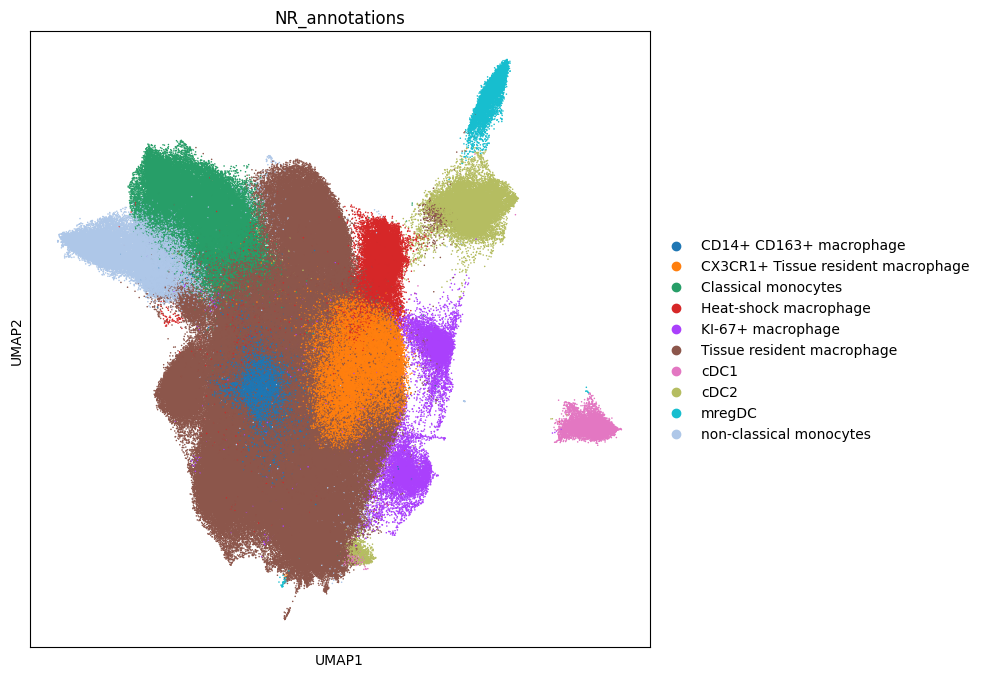

In [8]:
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data, color="NR_annotations", size=5)

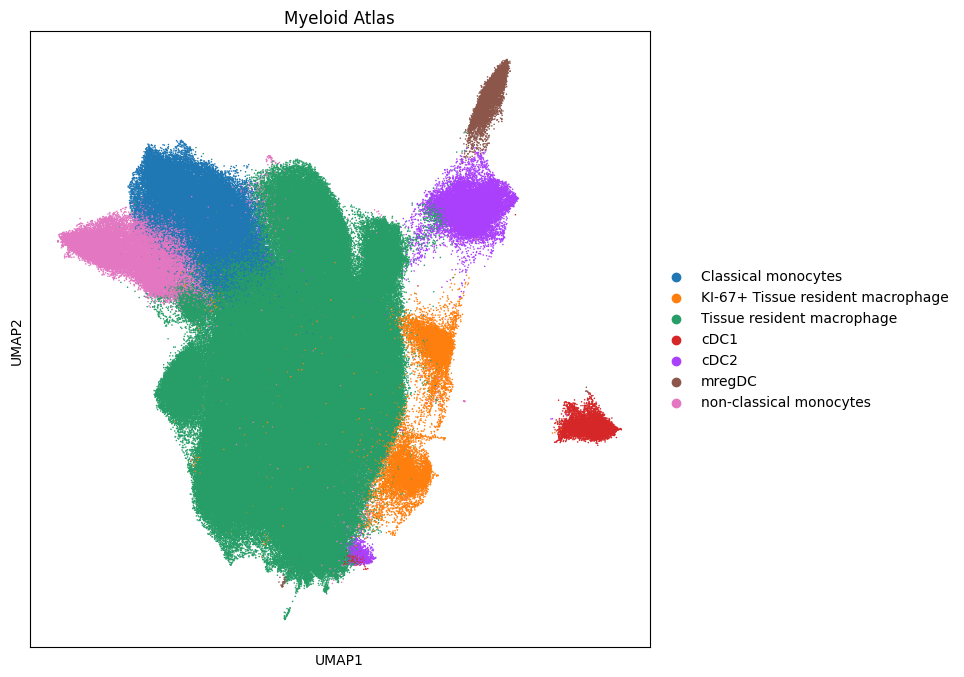

In [7]:
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data, color="NR_annotations_simple", size=5, title="Myeloid Atlas")

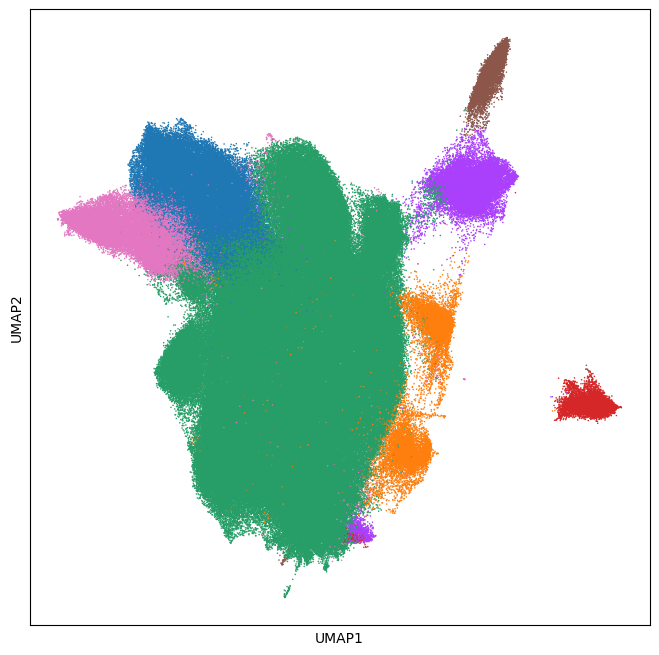

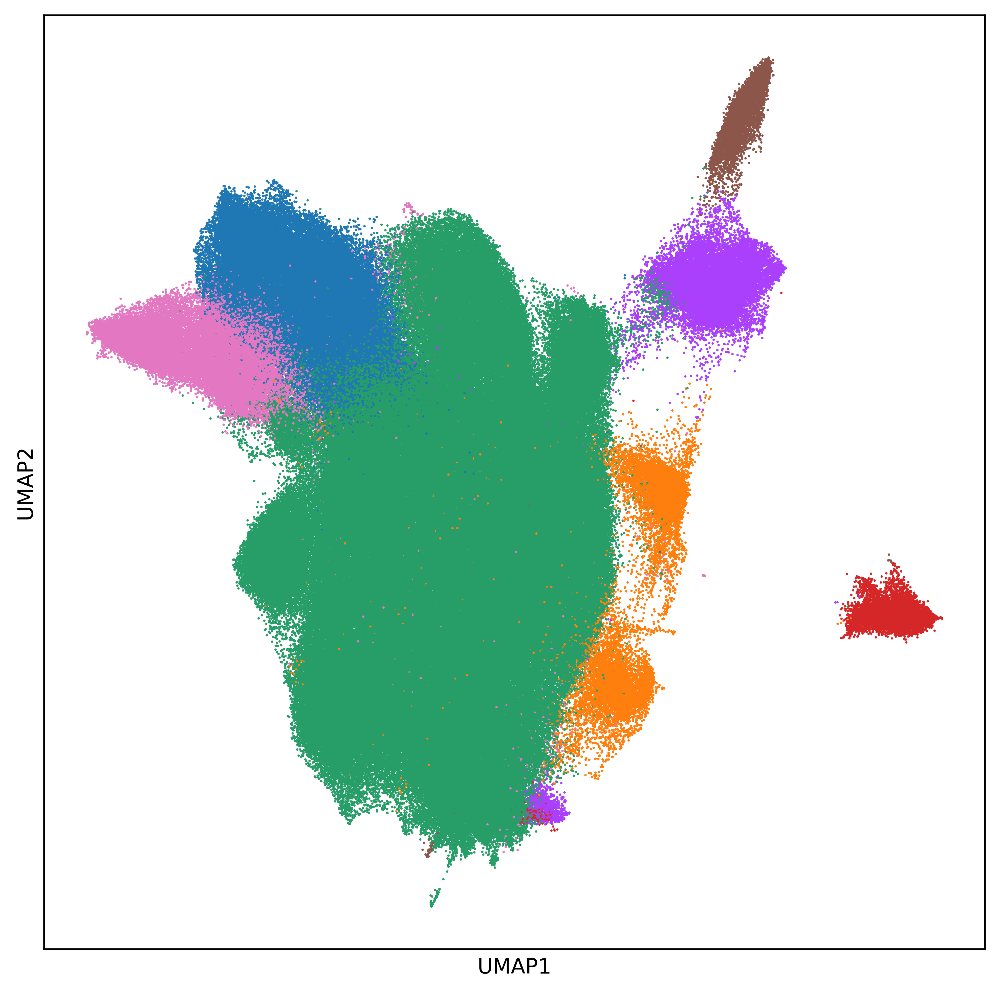

In [16]:
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data, color="NR_annotations_simple", size=5, title="", legend_loc=None)

with plt.rc_context({"figure.figsize": (8, 8), "figure.dpi": 600}):  
    sc.pl.umap(data, color="NR_annotations_simple", size=5, title="", legend_loc=None)

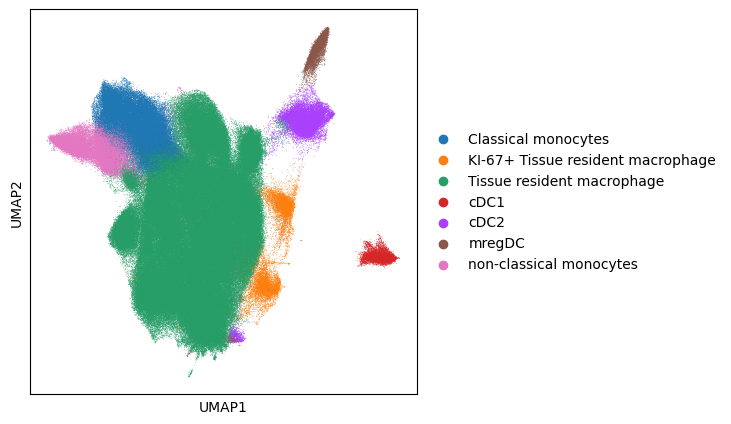

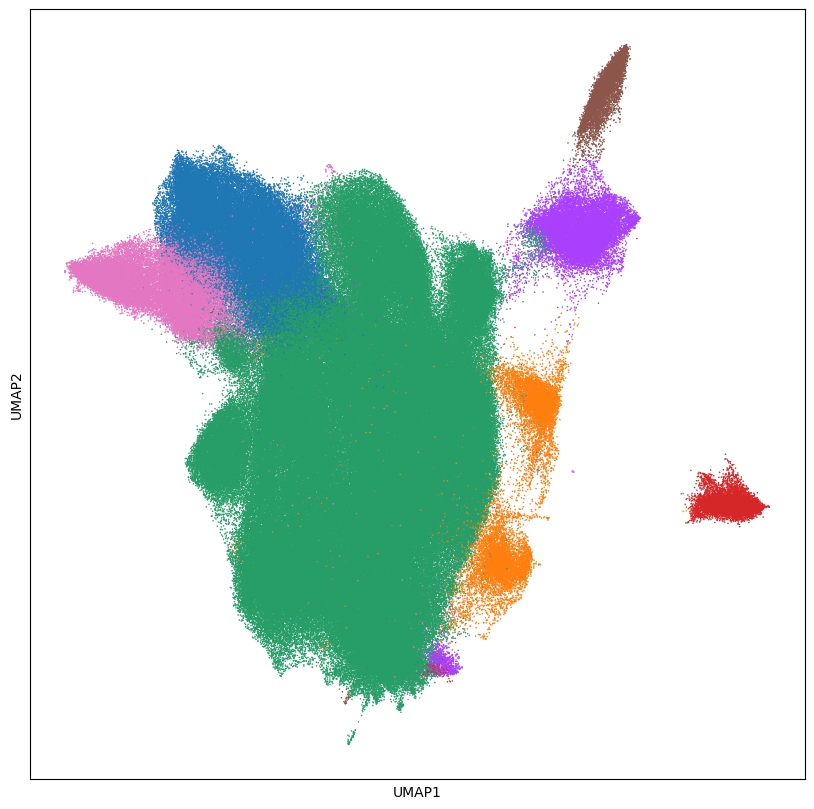

In [17]:
with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(data, 
               color="NR_annotations_simple", 
               size=1, 
               title="")
    
with plt.rc_context({"figure.figsize": (10, 10)}):
    sc.pl.umap(data, 
               color="NR_annotations_simple", 
               size=5, 
               legend_loc='none',
               title="")

In [8]:
#define function
def cluster_small_multiples(
    data_int, clust_key, size=10, frameon=False, legend_loc=None, **kwargs
):
    tmp = data_int.copy()

    for i, clust in enumerate(data_int.obs[clust_key].cat.categories):
        tmp.obs[clust] = data_int.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", data_int.uns[clust_key + "_colors"][i]]

    sc.pl.umap(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=data_int.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs
    )

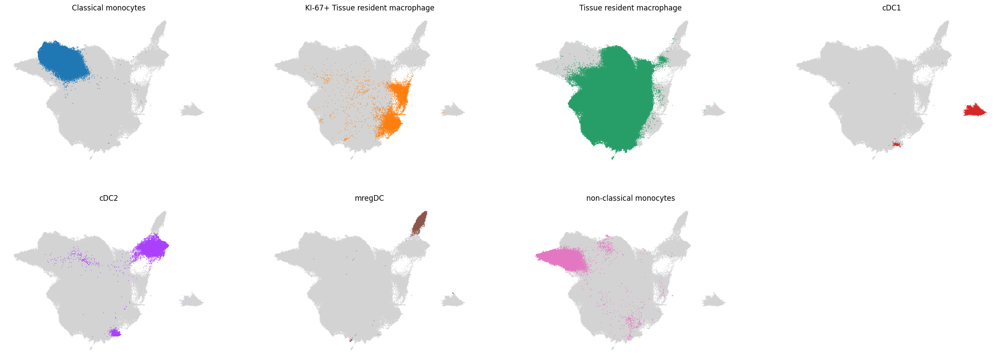

In [15]:
cluster_small_multiples(data, "NR_annotations_simple")

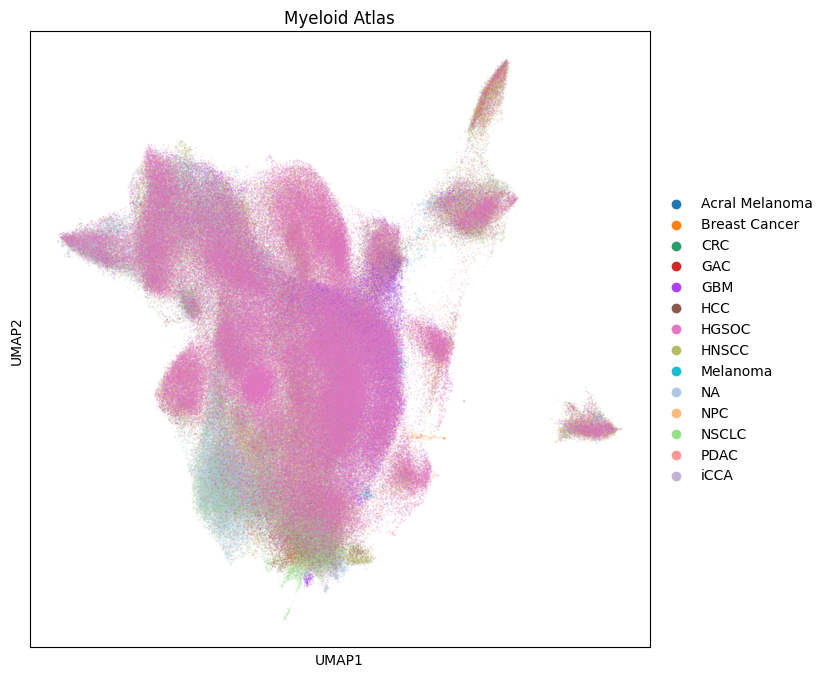

In [9]:
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data, color="cancer_type_broad", size=5, title="Myeloid Atlas", alpha=0.2)

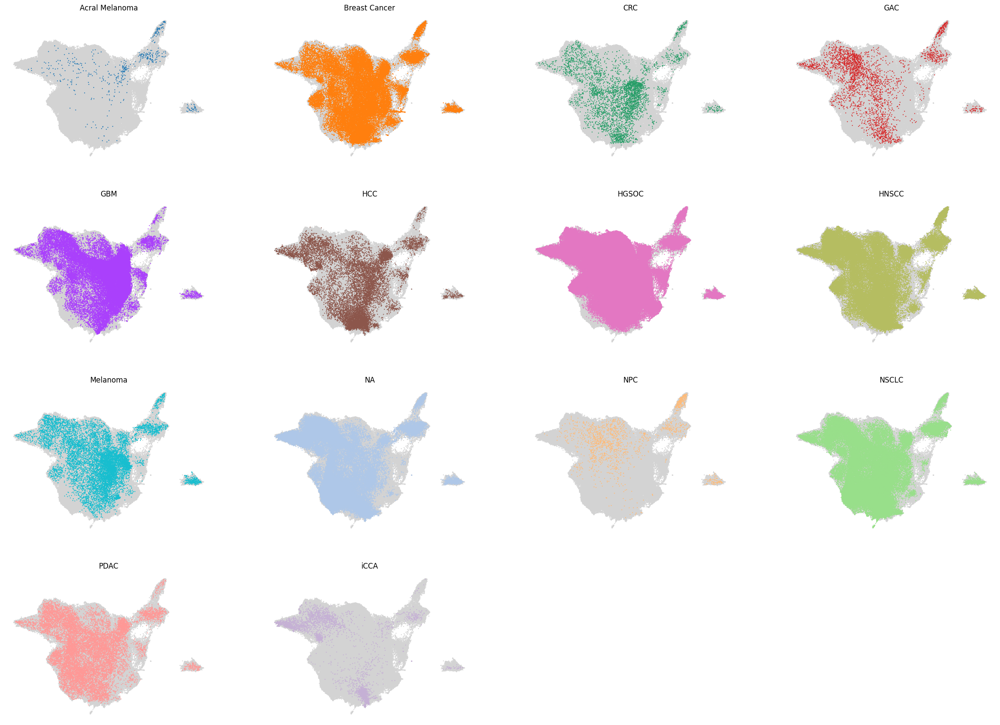

In [10]:
cluster_small_multiples(data, "cancer_type_broad")

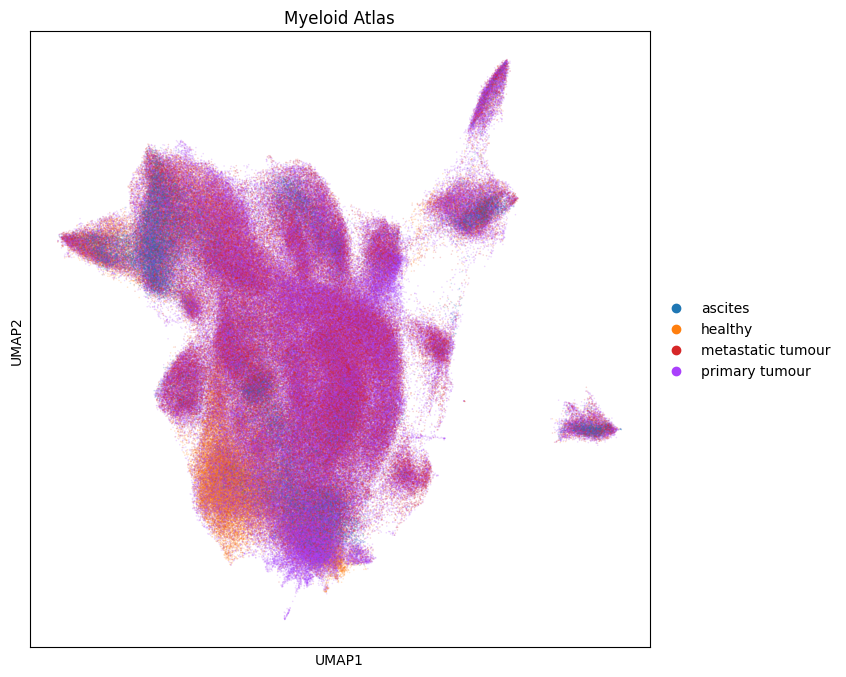

In [11]:
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data, color="sample_type_major2", size=5, title="Myeloid Atlas", alpha=0.2)

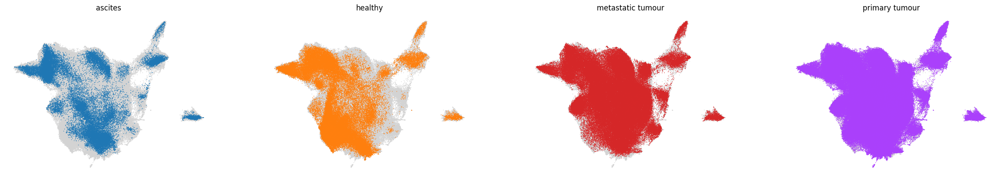

In [19]:
cluster_small_multiples(data, "sample_type_major2")

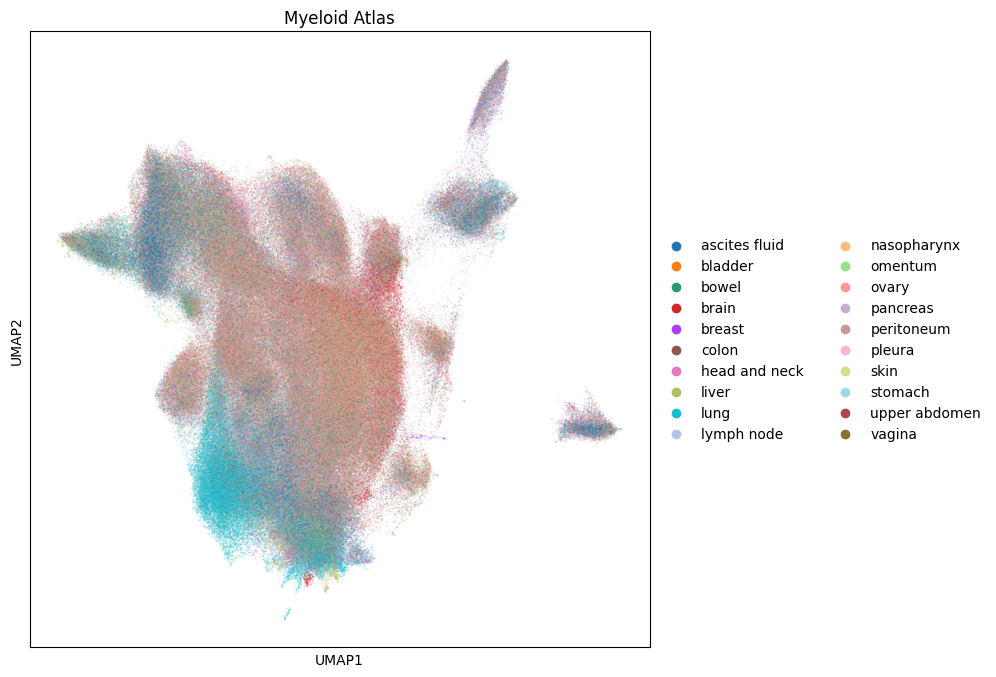

In [12]:
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data, color="site", size=5, title="Myeloid Atlas", alpha=0.2)

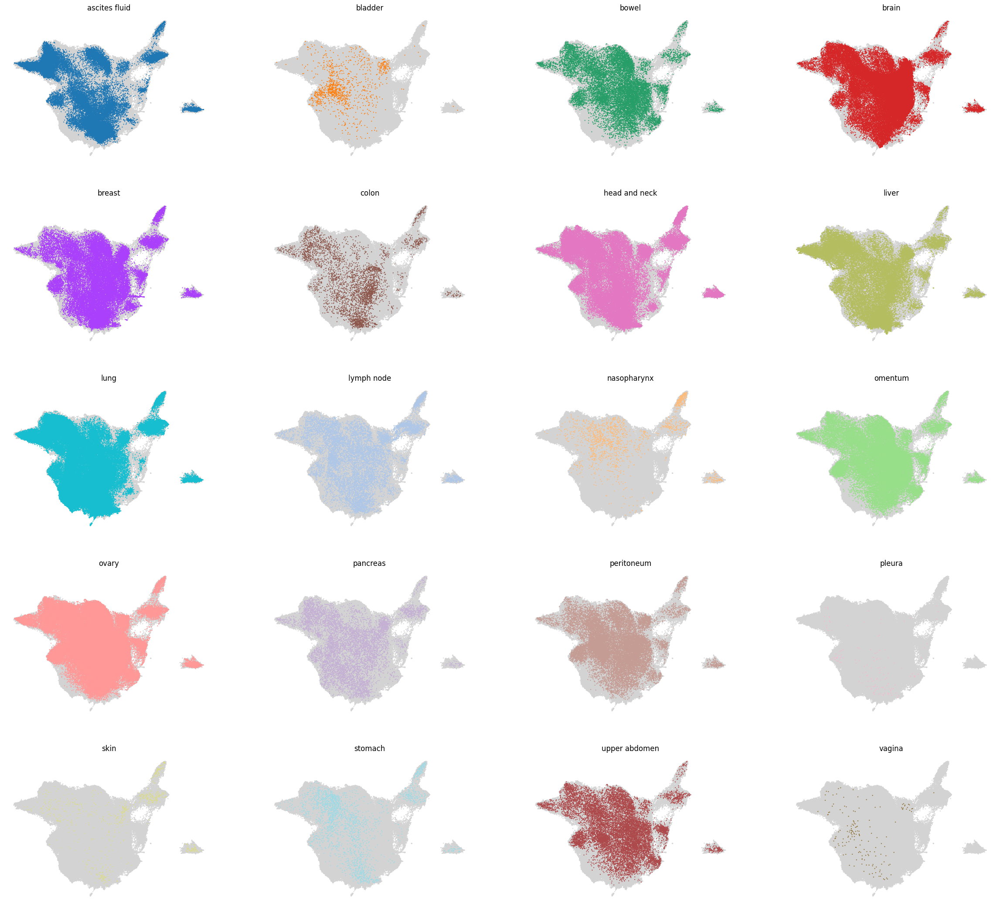

In [13]:
cluster_small_multiples(data, "site")

# Calculate DEG genes between clusters
* visualise with heatmap 

In [42]:
#calculate DEG genes (~15min):
sc.tl.rank_genes_groups(data, groupby="NR_annotations_simple", method="wilcoxon")

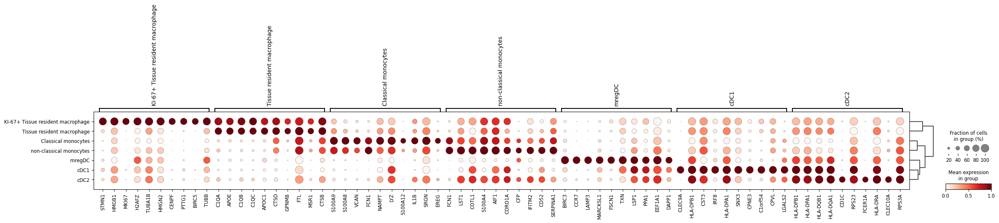

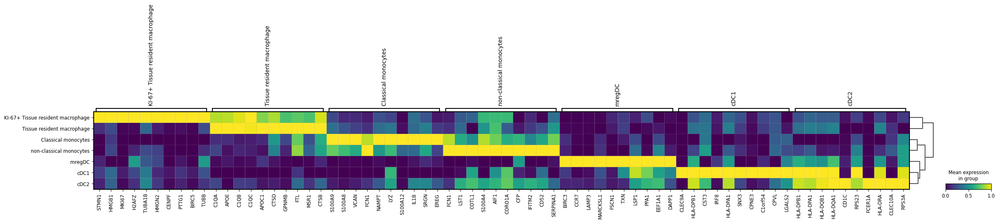

In [22]:
#visualise the top 10 DEG genes for each cluster
sc.pl.rank_genes_groups_dotplot(data, groupby="NR_annotations_simple", standard_scale="var", n_genes=10, min_logfoldchange=1)
sc.pl.rank_genes_groups_matrixplot(data, groupby="NR_annotations_simple", standard_scale="var", n_genes=10, min_logfoldchange=1)

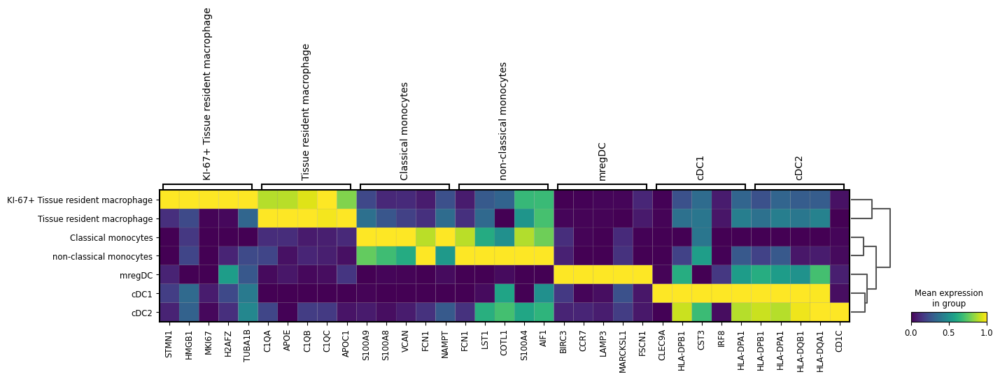

In [25]:
sc.pl.rank_genes_groups_matrixplot(data, groupby="NR_annotations_simple", standard_scale="var", n_genes=5, min_logfoldchange=1)

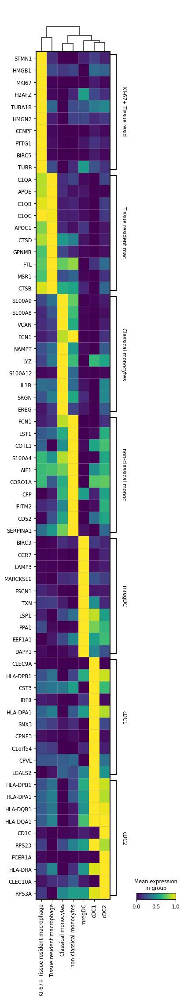

In [23]:
#flip above plot
sc.pl.rank_genes_groups_matrixplot(data, groupby="NR_annotations_simple", standard_scale="var", n_genes=10, min_logfoldchange=1, swap_axes=True)

# Plot cluster proportions by sample type, cancer type, tissue etc

In [25]:
# check
type_counts = data.obs['cancer_type_broad'].value_counts()
print(type_counts)

cancer_type_broad
HGSOC             212070
NA                 63409
NSCLC              54888
HNSCC              52659
GBM                34224
Breast Cancer      31823
PDAC               14061
HCC                12019
Melanoma           10542
CRC                 3879
iCCA                3466
GAC                 2894
NPC                 1610
Acral Melanoma       479
Name: count, dtype: int64


In [26]:
#make an object for each cancer_type_broad
sub_1 = data[data.obs["cancer_type_broad"] == "HGSOC"]
sub_2 = data[data.obs["cancer_type_broad"] == "NSCLC"]
sub_3 = data[data.obs["cancer_type_broad"] == "HNSCC"]
sub_4 = data[data.obs["cancer_type_broad"] == "GBM"]
sub_5 = data[data.obs["cancer_type_broad"] == "Breast Cancer"]
sub_6 = data[data.obs["cancer_type_broad"] == "PDAC"]
sub_7 = data[data.obs["cancer_type_broad"] == "HCC"]
sub_8 = data[data.obs["cancer_type_broad"] == "Melanoma"]
sub_9 = data[data.obs["cancer_type_broad"] == "CRC"]
sub_10 = data[data.obs["cancer_type_broad"] == "iCCA"]
sub_11 = data[data.obs["cancer_type_broad"] == "GAC"]
sub_12 = data[data.obs["cancer_type_broad"] == "NPC"]
sub_13 = data[data.obs["cancer_type_broad"] == "Acral Melanoma"]

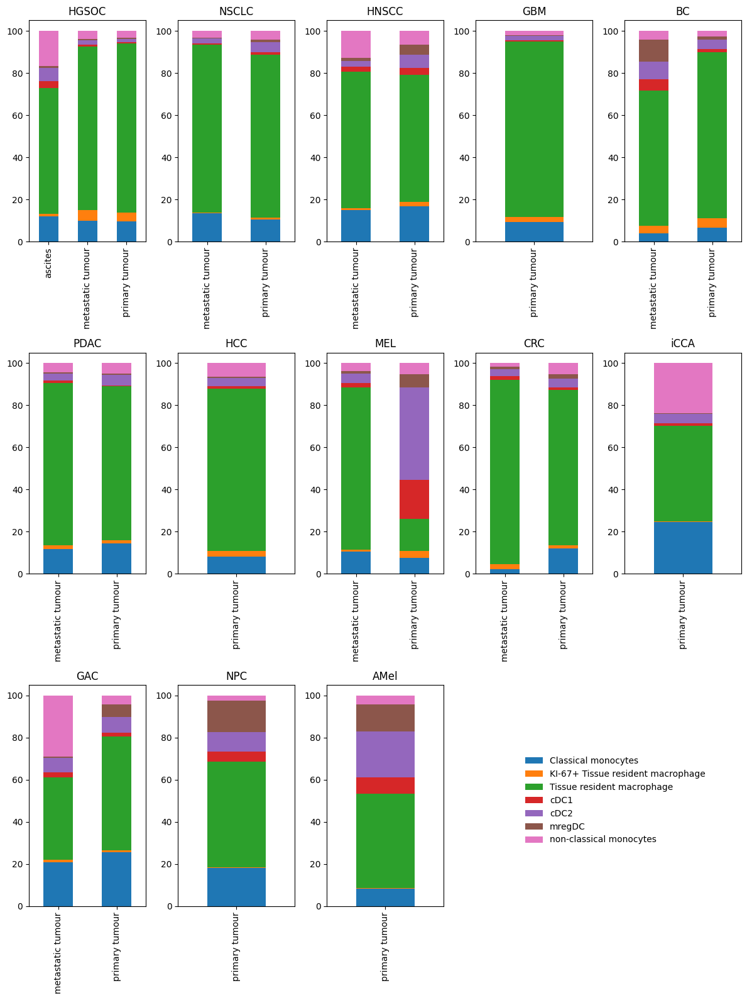

In [27]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(3, 5, figsize=(12, 16))

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_1.obs["sample_type_major2"], sub_1.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[0,0])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_2.obs["sample_type_major2"], sub_2.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[0,1])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_3.obs["sample_type_major2"], sub_3.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[0,2])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_4.obs["sample_type_major2"], sub_4.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[0,3])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_5.obs["sample_type_major2"], sub_5.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[0,4])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_6.obs["sample_type_major2"], sub_6.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[1,0])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_7.obs["sample_type_major2"], sub_7.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[1,1])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_8.obs["sample_type_major2"], sub_8.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[1,2])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_9.obs["sample_type_major2"], sub_9.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[1,3])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_10.obs["sample_type_major2"], sub_10.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[1,4])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_11.obs["sample_type_major2"], sub_11.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[2,0])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_12.obs["sample_type_major2"], sub_12.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[2,1])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_13.obs["sample_type_major2"], sub_13.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[2,2])


# Add titles if desired
axes[0,0].set_title("HGSOC")
axes[0,1].set_title("NSCLC")
axes[0,2].set_title("HNSCC")
axes[0,3].set_title("GBM")
axes[0,4].set_title("BC")
axes[1,0].set_title("PDAC")
axes[1,1].set_title("HCC")
axes[1,2].set_title("MEL")
axes[1,3].set_title("CRC")
axes[1,4].set_title("iCCA")
axes[2,0].set_title("GAC")
axes[2,1].set_title("NPC")
axes[2,2].set_title("AMel")

axes[0,0].set_xlabel("")
axes[0,1].set_xlabel("")
axes[0,2].set_xlabel("")
axes[0,3].set_xlabel("")
axes[0,4].set_xlabel("")
axes[1,0].set_xlabel("")
axes[1,1].set_xlabel("")
axes[1,2].set_xlabel("")
axes[1,3].set_xlabel("")
axes[1,4].set_xlabel("")
axes[2,0].set_xlabel("")
axes[2,1].set_xlabel("")
axes[2,2].set_xlabel("")

axes[2,3].set_visible(False)  
axes[2,4].set_visible(False) 

# Show the legend only for the entire figure, based on the last subplot (axes[2,2])
handles, labels = axes[2, 2].get_legend_handles_labels()  # Get handles from axes[2, 2] where the legend is

# Create a global legend in the bottom-right corner
fig.legend(handles, labels, loc='lower right', frameon=False, bbox_to_anchor=(0.95, 0.15))


plt.tight_layout()
plt.show()

### repeat including healthy 
* note healthy is adjacent/normal tissue from same tissue as primary tumour, except for melanoma where it represents an uninvolved LN (compare to mets)

In [28]:
#make an object for each cancer_with_H
sub_1 = data[data.obs["cancer_with_H"] == "HGSOC"]
sub_2 = data[data.obs["cancer_with_H"] == "NSCLC"]
sub_3 = data[data.obs["cancer_with_H"] == "HNSCC"]
sub_4 = data[data.obs["cancer_with_H"] == "GBM"]
sub_5 = data[data.obs["cancer_with_H"] == "Breast Cancer"]
sub_6 = data[data.obs["cancer_with_H"] == "PDAC"]
sub_7 = data[data.obs["cancer_with_H"] == "HCC"]
sub_8 = data[data.obs["cancer_with_H"] == "Melanoma"]
sub_9 = data[data.obs["cancer_with_H"] == "CRC"]
sub_10 = data[data.obs["cancer_with_H"] == "iCCA"]
sub_11 = data[data.obs["cancer_with_H"] == "GAC"]
sub_12 = data[data.obs["cancer_with_H"] == "NPC"]
sub_13 = data[data.obs["cancer_with_H"] == "Acral Melanoma"]

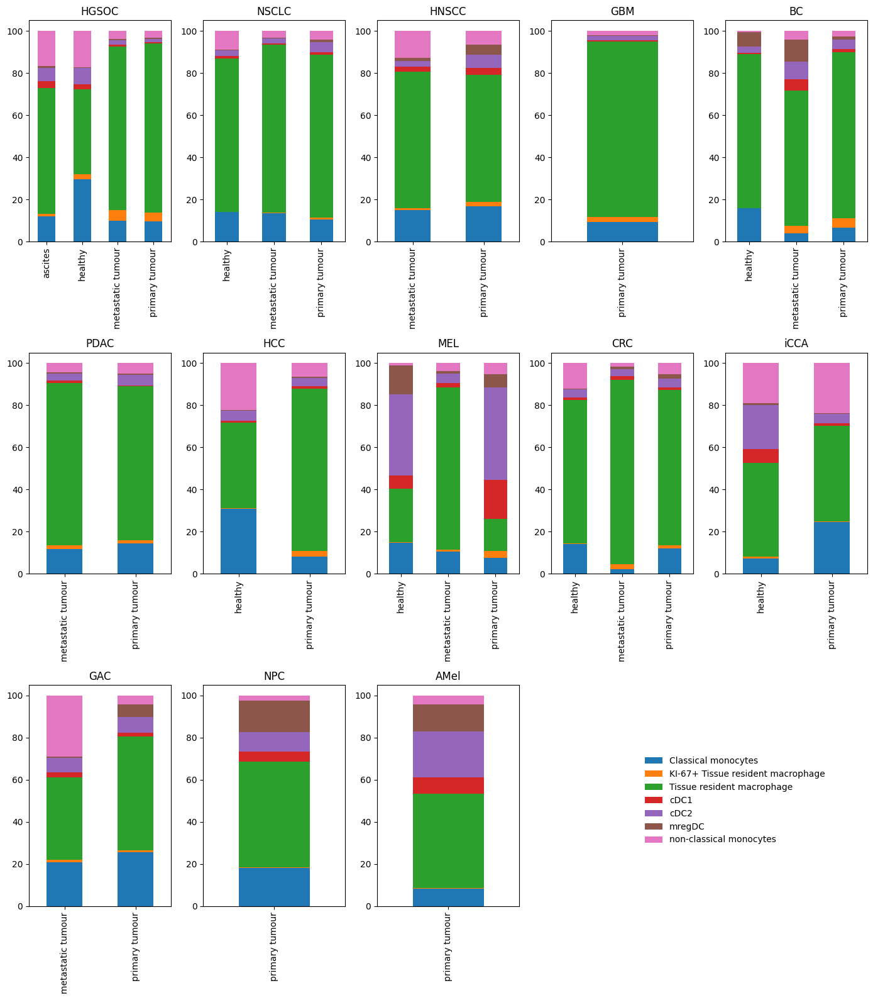

In [29]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(3, 5, figsize=(14, 16))

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_1.obs["sample_type_major2"], sub_1.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[0,0])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_2.obs["sample_type_major2"], sub_2.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[0,1])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_3.obs["sample_type_major2"], sub_3.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[0,2])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_4.obs["sample_type_major2"], sub_4.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[0,3])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_5.obs["sample_type_major2"], sub_5.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[0,4])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_6.obs["sample_type_major2"], sub_6.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[1,0])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_7.obs["sample_type_major2"], sub_7.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[1,1])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_8.obs["sample_type_major2"], sub_8.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[1,2])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_9.obs["sample_type_major2"], sub_9.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[1,3])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_10.obs["sample_type_major2"], sub_10.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[1,4])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_11.obs["sample_type_major2"], sub_11.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[2,0])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_12.obs["sample_type_major2"], sub_12.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[2,1])

# Create the stacked bar plot with the filtered data
pd.crosstab(sub_13.obs["sample_type_major2"], sub_13.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, legend=False, ax=axes[2,2])


# Add titles if desired
axes[0,0].set_title("HGSOC")
axes[0,1].set_title("NSCLC")
axes[0,2].set_title("HNSCC")
axes[0,3].set_title("GBM")
axes[0,4].set_title("BC")
axes[1,0].set_title("PDAC")
axes[1,1].set_title("HCC")
axes[1,2].set_title("MEL")
axes[1,3].set_title("CRC")
axes[1,4].set_title("iCCA")
axes[2,0].set_title("GAC")
axes[2,1].set_title("NPC")
axes[2,2].set_title("AMel")

axes[0,0].set_xlabel("")
axes[0,1].set_xlabel("")
axes[0,2].set_xlabel("")
axes[0,3].set_xlabel("")
axes[0,4].set_xlabel("")
axes[1,0].set_xlabel("")
axes[1,1].set_xlabel("")
axes[1,2].set_xlabel("")
axes[1,3].set_xlabel("")
axes[1,4].set_xlabel("")
axes[2,0].set_xlabel("")
axes[2,1].set_xlabel("")
axes[2,2].set_xlabel("")

axes[2,3].set_visible(False)  
axes[2,4].set_visible(False) 

# Show the legend only for the entire figure, based on the last subplot (axes[2,2])
handles, labels = axes[2, 2].get_legend_handles_labels()  # Get handles from axes[2, 2] where the legend is

# Create a global legend in the bottom-right corner
fig.legend(handles, labels, loc='lower right', frameon=False, bbox_to_anchor=(0.95, 0.15))


plt.tight_layout()
plt.show()

# can I add error bars^ based on sample? (to do that would need to calculate the proportion individually for each sample and then plot the average, as opposed to currently just pooling everything?)

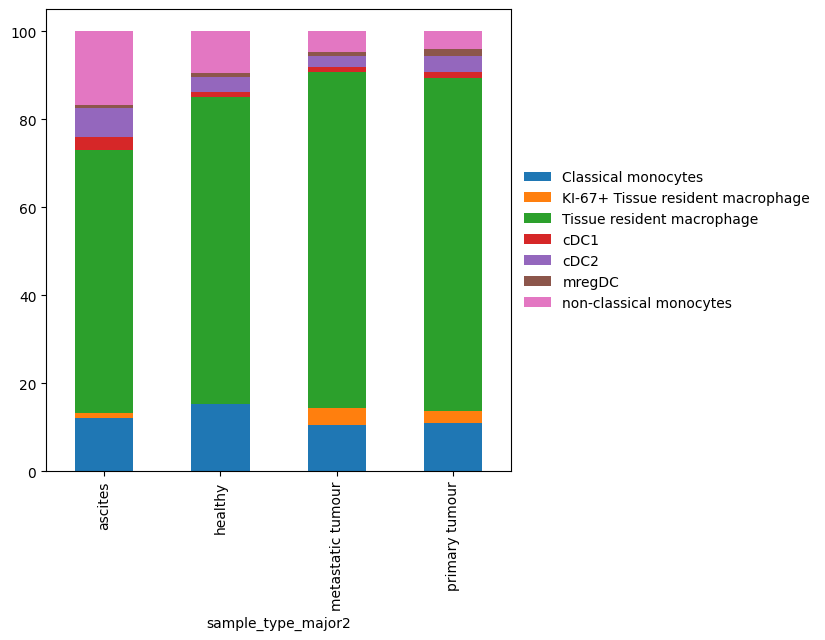

In [7]:
#### Creating a stacked bar: same as above but not sub-plotted
pd.crosstab(data.obs["sample_type_major2"], data.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(6,6))
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.show()

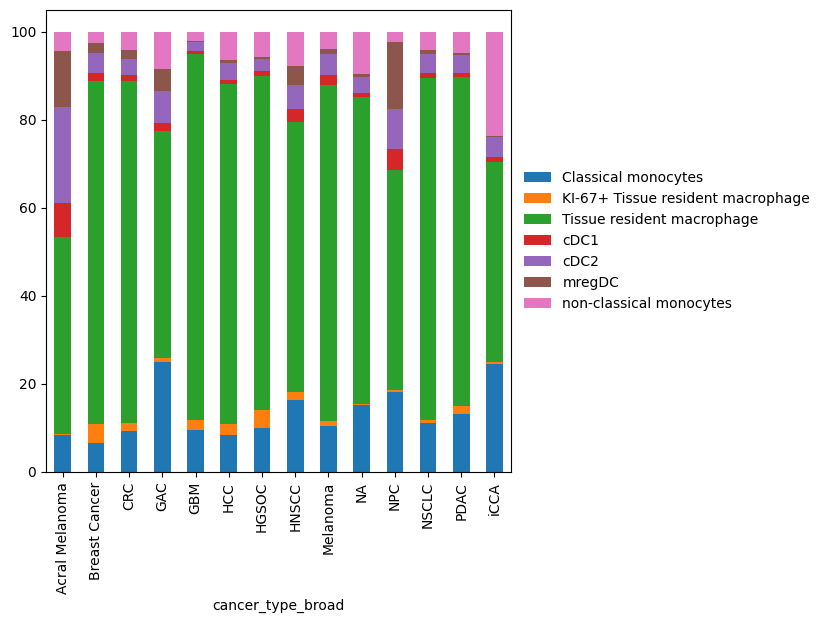

In [8]:
pd.crosstab(data.obs["cancer_type_broad"], data.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(6,6))
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.show()

#### less broad cancer types: 

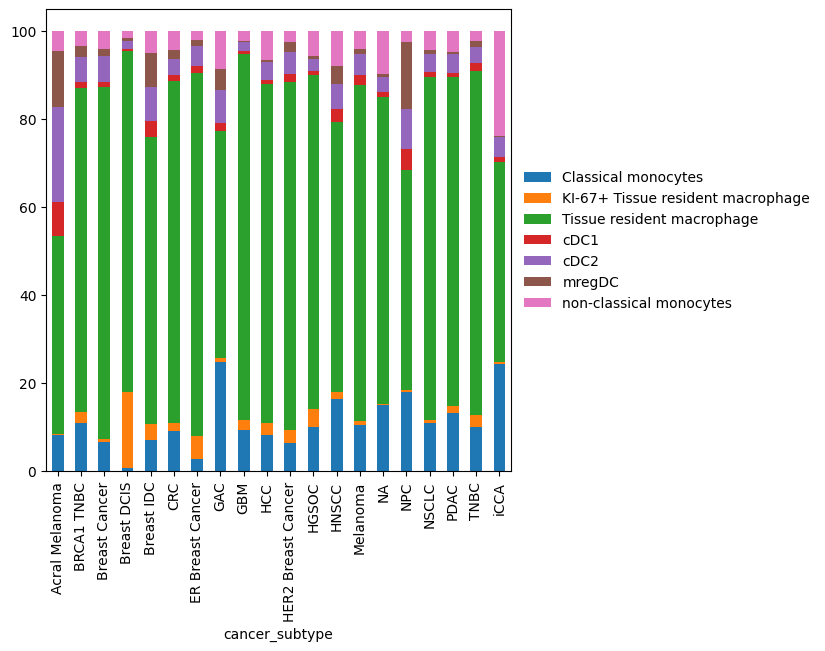

In [15]:
pd.crosstab(data.obs["cancer_subtype"], data.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(6,6))
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.show()

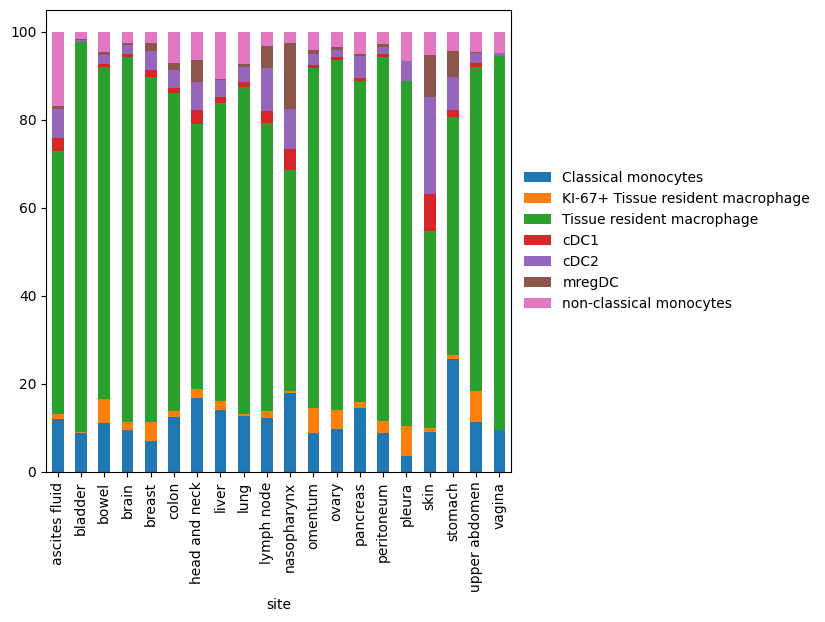

In [9]:
pd.crosstab(data.obs["site"], data.obs["NR_annotations_simple"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True, figsize=(6,6))
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)
plt.show()

# summarise sites for mets:

In [7]:
data_mets = data[data.obs["sample_type_major2"] == "metastatic tumour"]

In [13]:
cancer_type_broad_sites = {}

# Get unique values in `cancer_type_broad`
unique_cancer_types = data_mets.obs['cancer_type_broad'].unique()

# For each unique cancer type, get the unique `site` values
for cancer_type in unique_cancer_types:
    sites = data_mets.obs.loc[data_mets.obs['cancer_type_broad'] == cancer_type, 'site'].unique()
    cancer_type_broad_sites[cancer_type] = sites

# Convert the dictionary into a pandas DataFrame for export
df = pd.DataFrame([
    {"Cancer Type": cancer_type, "Sites": ", ".join(sites)}
    for cancer_type, sites in cancer_type_broad_sites.items()
])

# Export the DataFrame to an Excel file
output_path = "cancer_type_sites.xlsx"
df.to_excel(output_path, index=False)

In [12]:
df

,Cancer Type,Sites
0,Melanoma,"lymph node, brain"
1,HNSCC,"skin, pleura, lung, liver, lymph node"
2,HGSOC,"omentum, bowel, upper abdomen, peritoneum, lym..."
3,Breast Cancer,lymph node
4,NSCLC,"brain, lymph node"
5,GAC,"liver, ovary"
6,PDAC,"liver, lung, vagina"
7,CRC,peritoneum


# Plot DC proportions as box plots

In [7]:
#make an object for just primary and metastatic tumours
data_primary = data[data.obs["sample_type_major2"] == "primary tumour"]
data_mets = data[data.obs["sample_type_major2"] == "metastatic tumour"]
data_H = data[data.obs["sample_type_major2"] == "healthy"]
data_OC = data[data.obs["cancer_with_H"] == "HGSOC"]

## Primary tumour:

### Calculate the proportion of each DC type per sample and cancer subtype: 

In [8]:
# Create a DataFrame containing just sample, subtype and annotations 
df = data_primary.obs[["integration_id", "cancer_broadest", "NR_annotations_simple"]].copy()

# Create a new column for each DC type, indicating whether each cell belongs to that type (True vs False)
df["is_cDC1"] = df["NR_annotations_simple"] == "cDC1"
df["is_cDC2"] = df["NR_annotations_simple"] == "cDC2"
df["is_mregDC"] = df["NR_annotations_simple"] == "mregDC"

# Calculate proportions of each DC type per sample within each cancer subtype
proportion_df = (
    df.groupby(["integration_id", "cancer_broadest"])[["is_cDC1", "is_cDC2", "is_mregDC"]] #groups dataframe by each unique combo of sample_id and cancer type, keeps the booleen columns 
    .mean() #calculating the mean of a booleen column gives the proportion of true values 
    .reset_index()
    .rename(columns={"is_cDC1": "cDC1_proportion", "is_cDC2": "cDC2_proportion", "is_mregDC": "mregDC_proportion"}) #rename eg. is_cDC1 column to cDC1_proportion
)

#now have a dataframe containing proportion of each DC type for every sample and cancer type
proportion_df.head(15)

/scratch/temp/11909541/ipykernel_1820536/2000647374.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,integration_id,cancer_broadest,cDC1_proportion,cDC2_proportion,mregDC_proportion
0,GGSE223063_GLIO_1,BC,NaN,NaN,NaN
1,GGSE223063_GLIO_1,CRC,NaN,NaN,NaN
2,GGSE223063_GLIO_1,GAC,NaN,NaN,NaN
3,GGSE223063_GLIO_1,GBM,0.00749,0.009814,0.002841
4,GGSE223063_GLIO_1,HCC,NaN,NaN,NaN
5,GGSE223063_GLIO_1,HGSOC,NaN,NaN,NaN
6,GGSE223063_GLIO_1,HNSCC,NaN,NaN,NaN
7,GGSE223063_GLIO_1,MEL,NaN,NaN,NaN
8,GGSE223063_GLIO_1,NPC,NaN,NaN,NaN
9,GGSE223063_GLIO_1,NSCLC,NaN,NaN,NaN


In [9]:
# Melt the DataFrame to "long" format for seaborn plotting
proportion_df_long = proportion_df.melt(
    id_vars=["integration_id", "cancer_broadest"], 
    value_vars=["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"],
    var_name="Cell_Type",
    value_name="Proportion"
)

proportion_df_long.head(15)

,integration_id,cancer_broadest,Cell_Type,Proportion
0,GGSE223063_GLIO_1,BC,cDC1_proportion,NaN
1,GGSE223063_GLIO_1,CRC,cDC1_proportion,NaN
2,GGSE223063_GLIO_1,GAC,cDC1_proportion,NaN
3,GGSE223063_GLIO_1,GBM,cDC1_proportion,0.00749
4,GGSE223063_GLIO_1,HCC,cDC1_proportion,NaN
5,GGSE223063_GLIO_1,HGSOC,cDC1_proportion,NaN
6,GGSE223063_GLIO_1,HNSCC,cDC1_proportion,NaN
7,GGSE223063_GLIO_1,MEL,cDC1_proportion,NaN
8,GGSE223063_GLIO_1,NPC,cDC1_proportion,NaN
9,GGSE223063_GLIO_1,NSCLC,cDC1_proportion,NaN


In [10]:
#export proportion_df_long 
proportion_df_long.to_excel("2024-12-07_DC_prop_primary.xlsx", index=False)

### Perform ANOVA to compare the proportion of each DC type between cancer types

In [10]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [19]:
# Drop rows where "Proportion" is NaN
proportion_non_nan = proportion_df_long.dropna(subset=["Proportion"])

In [20]:
results_anova = {} #define a dictionary to store anova results in

for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type] #subset the data by cell type
    model = ols("Proportion ~ cancer_type_broad", data=subset).fit() #Define the model: Proportion ~ cancer_type_broad
    anova_results = sm.stats.anova_lm(model, typ=2) #perform anova
    results_anova[cell_type] = anova_results #store results
    print(f"ANOVA for {cell_type}:\n{anova_results}\n")

ANOVA for cDC1_proportion:
                     sum_sq     df          F        PR(>F)
cancer_type_broad  0.119908   12.0  14.666717  6.185125e-25
Residual           0.241860  355.0        NaN           NaN

ANOVA for cDC2_proportion:
                     sum_sq     df          F        PR(>F)
cancer_type_broad  0.592684   12.0  14.869649  2.872042e-25
Residual           1.179152  355.0        NaN           NaN

ANOVA for mregDC_proportion:
                     sum_sq     df          F        PR(>F)
cancer_type_broad  0.240642   12.0  20.075044  2.122233e-33
Residual           0.354619  355.0        NaN           NaN



In [21]:
# perform Tukey's multiple comparison test
results_T = {}

for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type]
    tukey = pairwise_tukeyhsd(endog=subset["Proportion"], groups=subset["cancer_type_broad"], alpha=0.05)
    results_T[cell_type] = tukey.summary()
    print(f"Tukey's HSD for {cell_type}:\n{tukey.summary()}\n")

Tukey's HSD for cDC1_proportion:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1         group2    meandiff p-adj   lower   upper  reject
-------------------------------------------------------------------
Acral Melanoma Breast Cancer  -0.0584 0.0012 -0.1031 -0.0137   True
Acral Melanoma           CRC  -0.0669 0.0024 -0.1202 -0.0136   True
Acral Melanoma           GAC  -0.0511 0.0756 -0.1044  0.0023  False
Acral Melanoma           GBM  -0.0679 0.0002 -0.1151 -0.0208   True
Acral Melanoma           HCC  -0.0631 0.0131 -0.1193 -0.0069   True
Acral Melanoma         HGSOC  -0.0642 0.0002 -0.1089 -0.0194   True
Acral Melanoma         HNSCC  -0.0388 0.1588 -0.0832  0.0056  False
Acral Melanoma      Melanoma   0.1101 0.0001  0.0347  0.1855   True
Acral Melanoma           NPC  -0.0273 0.9065 -0.0818  0.0273  False
Acral Melanoma         NSCLC  -0.0648 0.0002   -0.11 -0.0196   True
Acral Melanoma          PDAC  -0.0737 0.0001 -0.1231 -0.0243   True
Acral Melanoma 

# plotting here supersceeded: now done in prism from data exported above ***

### Plot as boxplots:

In [22]:
from statannotations.Annotator import Annotator
import itertools

/scratch/temp/11802321/ipykernel_2360467/3297764067.py:13: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.



p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

GBM vs. HCC: Custom statistical test, P_val:-1.031e-01
GAC vs. GBM: Custom statistical test, P_val:-8.320e-02
HCC vs. HGSOC: Custom statistical test, P_val:1.062e-01
NSCLC vs. PDAC: Custom statistical test, P_val:-3.670e-02
NPC vs. NSCLC: Custom statistical test, P_val:-2.970e-02
HGSOC vs. HNSCC: Custom statistical test, P_val:9.240e-02
HNSCC vs. Melanoma: Custom statistical test, P_val:-7.320e-02
PDAC vs. iCCA: Custom statistical test, P_val:-1.880e-02
Breast Cancer vs. CRC: Custom statistical test, P_val:-1.260e-02
Acral Melanoma vs. Breast Cancer: Custom statistical test, P_val:-5.310e-02
Melanoma vs. NPC: Custom statistical test, P_val:-5.250e-02
CRC vs. GAC: Custom statistical test, P_val:-2.250e-02
GBM vs. HGSOC: Custom statistical test, P_val:3.470e-02
CRC vs. GBM: Custom statistical test, 

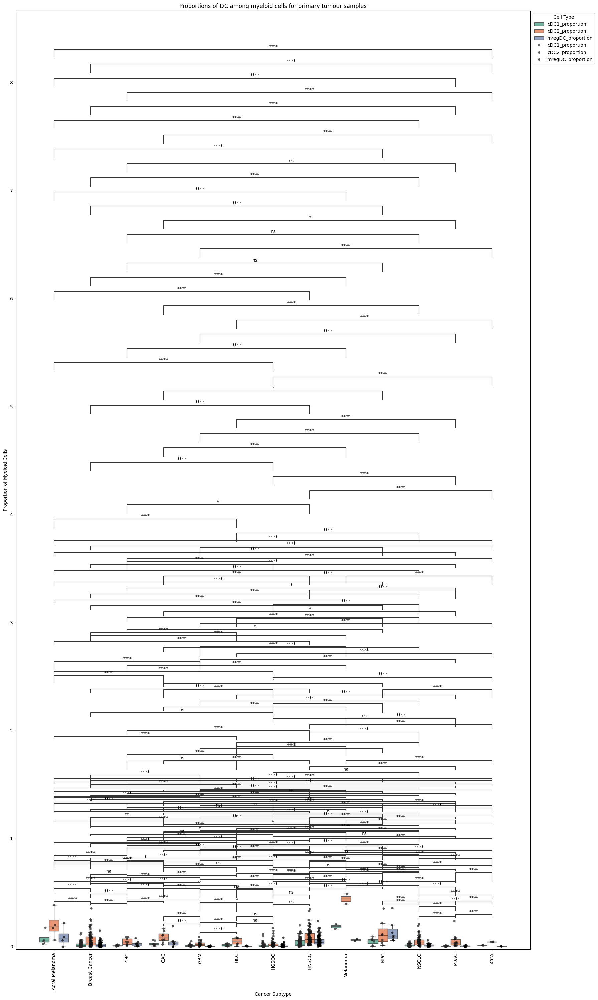

In [26]:
# Set up the plot
plt.figure(figsize=(18, 30))

# Create the grouped box plot and assign the axis to box_ax
box_ax = sns.boxplot(
    x="cancer_type_broad", y="Proportion", hue="Cell_Type", 
    data=proportion_non_nan, 
    palette="Set2",  # Customize the color palette
    showfliers=False  # Optionally hide outliers
)

# Overlay individual data points as a scatter (strip plot)
sns.stripplot(
    x="cancer_type_broad", y="Proportion", hue="Cell_Type", data=proportion_non_nan,
    color="black", size=5, jitter=True, alpha=0.7, dodge=True  # Adjust appearance of data points
)

# Generate all possible pairs of cancer types
cancer_types = proportion_non_nan["cancer_type_broad"].unique()
pairs = list(itertools.combinations(cancer_types, 2))

# Loop over each cell type and add significance annotations
for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:

    # Fetch Tukey's results from the previous analysis
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type]
    tukey = pairwise_tukeyhsd(
        endog=subset["Proportion"], 
        groups=subset["cancer_type_broad"], 
        alpha=0.05
    )
    
    # Extract p-values from Tukey's HSD test summary
    tukey_summary = tukey.summary().data  # Access the summary data
    pvalues = [row[4] for row in tukey_summary[1:]]  # Extract p-values (ignoring the first row, which is the header)

    # Define the annotations (this assumes the results are structured as shown in your previous output)
    annotator = Annotator(
        box_ax, pairs, data=proportion_non_nan, x="cancer_type_broad", y="Proportion"
    )
    
    # Use p-values from the Tukey test to annotate the plot
    annotator.set_pvalues(pvalues)
    annotator.annotate()

# Customize plot labels
plt.ylabel("Proportion of Myeloid Cells")
plt.xlabel("Cancer Subtype")
plt.title("Proportions of DC among myeloid cells for primary tumour samples")

# Make x-axis labels vertical for readability if needed
plt.xticks(rotation=90)

# Adjust legend position
plt.legend(title="Cell Type", loc="upper left", bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

/scratch/temp/11802321/ipykernel_2360467/2813958211.py:13: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.



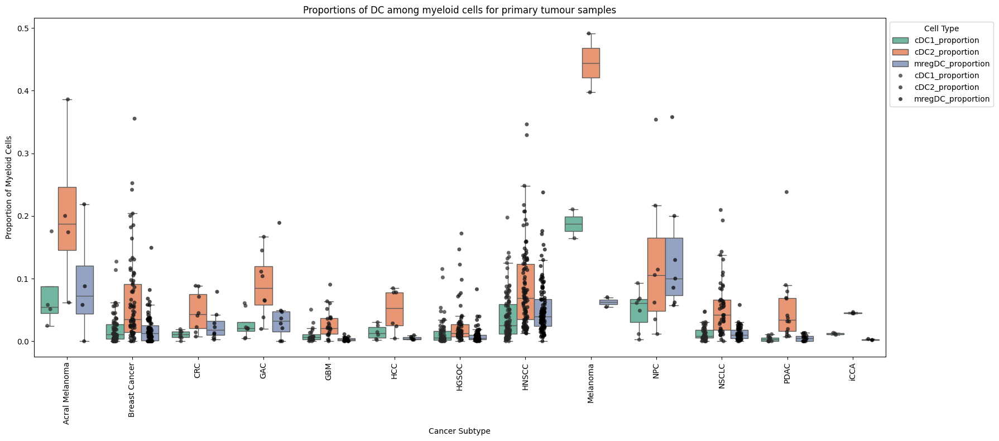

In [28]:
# Set up the plot
plt.figure(figsize=(18, 8))

# Create the grouped box plot and assign the axis to box_ax
box_ax = sns.boxplot(
    x="cancer_type_broad", y="Proportion", hue="Cell_Type", 
    data=proportion_non_nan, 
    palette="Set2",  # Customize the color palette
    showfliers=False  # Optionally hide outliers
)

# Overlay individual data points as a scatter (strip plot)
sns.stripplot(
    x="cancer_type_broad", y="Proportion", hue="Cell_Type", data=proportion_non_nan,
    color="black", size=5, jitter=True, alpha=0.7, dodge=True  # Adjust appearance of data points
)

# Customize plot labels
plt.ylabel("Proportion of Myeloid Cells")
plt.xlabel("Cancer Subtype")
plt.title("Proportions of DC among myeloid cells for primary tumour samples")

# Make x-axis labels vertical for readability if needed
plt.xticks(rotation=90)

# Adjust legend position
plt.legend(title="Cell Type", loc="upper left", bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

### ^how do I account for the different total cell counts within each dot?

### Done one-way anova above, but too many significant to put stars on plot

## Repeat for Mets:

### Calculate the proportion of each DC type per sample and cancer subtype: 

In [11]:
# Create a DataFrame containing just sample, subtype and annotations 
df = data_mets.obs[["integration_id", "cancer_broadest", "NR_annotations_simple"]].copy()

# Create a new column for each DC type, indicating whether each cell belongs to that type (True vs False)
df["is_cDC1"] = df["NR_annotations_simple"] == "cDC1"
df["is_cDC2"] = df["NR_annotations_simple"] == "cDC2"
df["is_mregDC"] = df["NR_annotations_simple"] == "mregDC"

# Calculate proportions of each DC type per sample within each cancer subtype
proportion_df = (
    df.groupby(["integration_id", "cancer_broadest"])[["is_cDC1", "is_cDC2", "is_mregDC"]] #groups dataframe by each unique combo of sample_id and cancer type, keeps the booleen columns 
    .mean() #calculating the mean of a booleen column gives the proportion of true values 
    .reset_index()
    .rename(columns={"is_cDC1": "cDC1_proportion", "is_cDC2": "cDC2_proportion", "is_mregDC": "mregDC_proportion"}) #rename eg. is_cDC1 column to cDC1_proportion
)

#now have a dataframe containing proportion of each DC type for every sample and cancer type
proportion_df.head(15)

/scratch/temp/11909541/ipykernel_1820536/2907794242.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,integration_id,cancer_broadest,cDC1_proportion,cDC2_proportion,mregDC_proportion
0,GSE131907_LUAD_B3002,BC,NaN,NaN,NaN
1,GSE131907_LUAD_B3002,CRC,NaN,NaN,NaN
2,GSE131907_LUAD_B3002,GAC,NaN,NaN,NaN
3,GSE131907_LUAD_B3002,HGSOC,NaN,NaN,NaN
4,GSE131907_LUAD_B3002,HNSCC,NaN,NaN,NaN
5,GSE131907_LUAD_B3002,MEL,NaN,NaN,NaN
6,GSE131907_LUAD_B3002,NSCLC,0.002793,0.067039,0.001397
7,GSE131907_LUAD_B3002,PDAC,NaN,NaN,NaN
8,GSE131907_LUAD_B3003,BC,NaN,NaN,NaN
9,GSE131907_LUAD_B3003,CRC,NaN,NaN,NaN


In [12]:
# Melt the DataFrame to "long" format for seaborn plotting
proportion_df_long = proportion_df.melt(
    id_vars=["integration_id", "cancer_broadest"], 
    value_vars=["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"],
    var_name="Cell_Type",
    value_name="Proportion"
)

proportion_df_long.head(15)

,integration_id,cancer_broadest,Cell_Type,Proportion
0,GSE131907_LUAD_B3002,BC,cDC1_proportion,NaN
1,GSE131907_LUAD_B3002,CRC,cDC1_proportion,NaN
2,GSE131907_LUAD_B3002,GAC,cDC1_proportion,NaN
3,GSE131907_LUAD_B3002,HGSOC,cDC1_proportion,NaN
4,GSE131907_LUAD_B3002,HNSCC,cDC1_proportion,NaN
5,GSE131907_LUAD_B3002,MEL,cDC1_proportion,NaN
6,GSE131907_LUAD_B3002,NSCLC,cDC1_proportion,0.002793
7,GSE131907_LUAD_B3002,PDAC,cDC1_proportion,NaN
8,GSE131907_LUAD_B3003,BC,cDC1_proportion,NaN
9,GSE131907_LUAD_B3003,CRC,cDC1_proportion,NaN


In [13]:
#export proportion_df_long 
proportion_df_long.to_excel("2024-12-07_DC_prop_mets.xlsx", index=False)

### Perform ANOVA to compare the proportion of each DC type between cancer types

In [31]:
# Drop rows where "Proportion" is NaN
proportion_non_nan = proportion_df_long.dropna(subset=["Proportion"])

In [32]:
results_anova = {} #define a dictionary to store anova results in

for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type] #subset the data by cell type
    model = ols("Proportion ~ cancer_type_broad", data=subset).fit() #Define the model: Proportion ~ cancer_type_broad
    anova_results = sm.stats.anova_lm(model, typ=2) #perform anova
    results_anova[cell_type] = anova_results #store results
    print(f"ANOVA for {cell_type}:\n{anova_results}\n")

ANOVA for cDC1_proportion:
                     sum_sq     df          F        PR(>F)
cancer_type_broad  0.020883    7.0  11.027999  6.869266e-11
Residual           0.035167  130.0        NaN           NaN

ANOVA for cDC2_proportion:
                     sum_sq     df         F        PR(>F)
cancer_type_broad  0.082779    7.0  7.248603  2.514561e-07
Residual           0.212086  130.0       NaN           NaN

ANOVA for mregDC_proportion:
                     sum_sq     df        F    PR(>F)
cancer_type_broad  0.090758    7.0  6.02215  0.000004
Residual           0.279884  130.0      NaN       NaN



In [33]:
# perform Tukey's multiple comparison test
results_T = {}

for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type]
    tukey = pairwise_tukeyhsd(endog=subset["Proportion"], groups=subset["cancer_type_broad"], alpha=0.05)
    results_T[cell_type] = tukey.summary()
    print(f"Tukey's HSD for {cell_type}:\n{tukey.summary()}\n")

Tukey's HSD for cDC1_proportion:
     Multiple Comparison of Means - Tukey HSD, FWER=0.05     
    group1     group2  meandiff p-adj   lower   upper  reject
-------------------------------------------------------------
Breast Cancer      CRC  -0.0367   0.02 -0.0701 -0.0034   True
Breast Cancer      GAC  -0.0323 0.1912 -0.0715   0.007  False
Breast Cancer    HGSOC  -0.0434    0.0 -0.0604 -0.0263   True
Breast Cancer    HNSCC  -0.0377    0.0 -0.0581 -0.0173   True
Breast Cancer Melanoma  -0.0226  0.042 -0.0447 -0.0004   True
Breast Cancer    NSCLC  -0.0478    0.0  -0.068 -0.0276   True
Breast Cancer     PDAC  -0.0404 0.0001 -0.0666 -0.0142   True
          CRC      GAC   0.0045    1.0 -0.0418  0.0507  False
          CRC    HGSOC  -0.0066 0.9973 -0.0365  0.0232  False
          CRC    HNSCC  -0.0009    1.0 -0.0328  0.0309  False
          CRC Melanoma   0.0141 0.8894 -0.0189  0.0472  False
          CRC    NSCLC  -0.0111 0.9613 -0.0428  0.0207  False
          CRC     PDAC  -0.0037    1.

### Plot as boxplots:

/scratch/temp/11802321/ipykernel_2360467/2035086142.py:13: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.



p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

NSCLC vs. PDAC: Custom statistical test, P_val:-7.010e-02
Melanoma vs. NSCLC: Custom statistical test, P_val:-6.800e-02
Breast Cancer vs. CRC: Custom statistical test, P_val:-4.340e-02
HGSOC vs. HNSCC: Custom statistical test, P_val:4.400e-03
GAC vs. HGSOC: Custom statistical test, P_val:-1.860e-02
CRC vs. GAC: Custom statistical test, P_val:-2.700e-02
HNSCC vs. Melanoma: Custom statistical test, P_val:-4.480e-02
HNSCC vs. NSCLC: Custom statistical test, P_val:-4.470e-02
Melanoma vs. PDAC: Custom statistical test, P_val:-4.280e-02
Breast Cancer vs. GAC: Custom statistical test, P_val:-4.950e-02
CRC vs. HGSOC: Custom statistical test, P_val:-8.300e-03
HGSOC vs. Melanoma: Custom statistical test, P_val:-1.810e-02
GAC vs. HNSCC: Custom statistical test, P_val:-4.350e-02
HGSOC vs. NSCLC: Custom statis

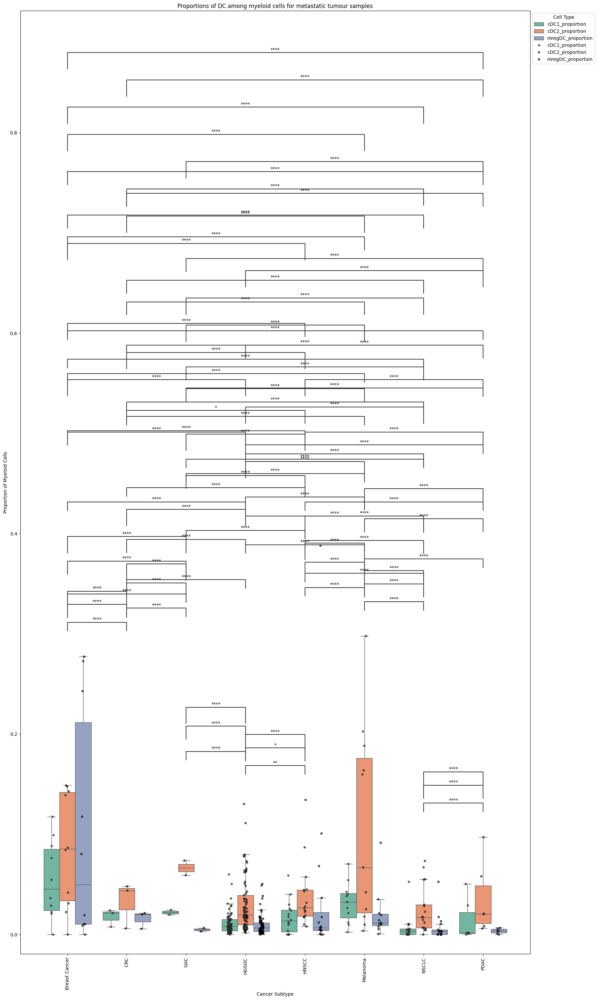

In [34]:
# Set up the plot
plt.figure(figsize=(18, 30))

# Create the grouped box plot and assign the axis to box_ax
box_ax = sns.boxplot(
    x="cancer_type_broad", y="Proportion", hue="Cell_Type", 
    data=proportion_non_nan, 
    palette="Set2",  # Customize the color palette
    showfliers=False  # Optionally hide outliers
)

# Overlay individual data points as a scatter (strip plot)
sns.stripplot(
    x="cancer_type_broad", y="Proportion", hue="Cell_Type", data=proportion_non_nan,
    color="black", size=5, jitter=True, alpha=0.7, dodge=True  # Adjust appearance of data points
)

# Generate all possible pairs of cancer types
cancer_types = proportion_non_nan["cancer_type_broad"].unique()
pairs = list(itertools.combinations(cancer_types, 2))

# Loop over each cell type and add significance annotations
for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:

    # Fetch Tukey's results from the previous analysis
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type]
    tukey = pairwise_tukeyhsd(
        endog=subset["Proportion"], 
        groups=subset["cancer_type_broad"], 
        alpha=0.05
    )
    
    # Extract p-values from Tukey's HSD test summary
    tukey_summary = tukey.summary().data  # Access the summary data
    pvalues = [row[4] for row in tukey_summary[1:]]  # Extract p-values (ignoring the first row, which is the header)

    # Define the annotations (this assumes the results are structured as shown in your previous output)
    annotator = Annotator(
        box_ax, pairs, data=proportion_non_nan, x="cancer_type_broad", y="Proportion"
    )
    
    # Use p-values from the Tukey test to annotate the plot
    annotator.set_pvalues(pvalues)
    annotator.annotate()

# Customize plot labels
plt.ylabel("Proportion of Myeloid Cells")
plt.xlabel("Cancer Subtype")
plt.title("Proportions of DC among myeloid cells for metastatic tumour samples")

# Make x-axis labels vertical for readability if needed
plt.xticks(rotation=90)

# Adjust legend position
plt.legend(title="Cell Type", loc="upper left", bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

/scratch/temp/11802321/ipykernel_2360467/3767499611.py:13: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.



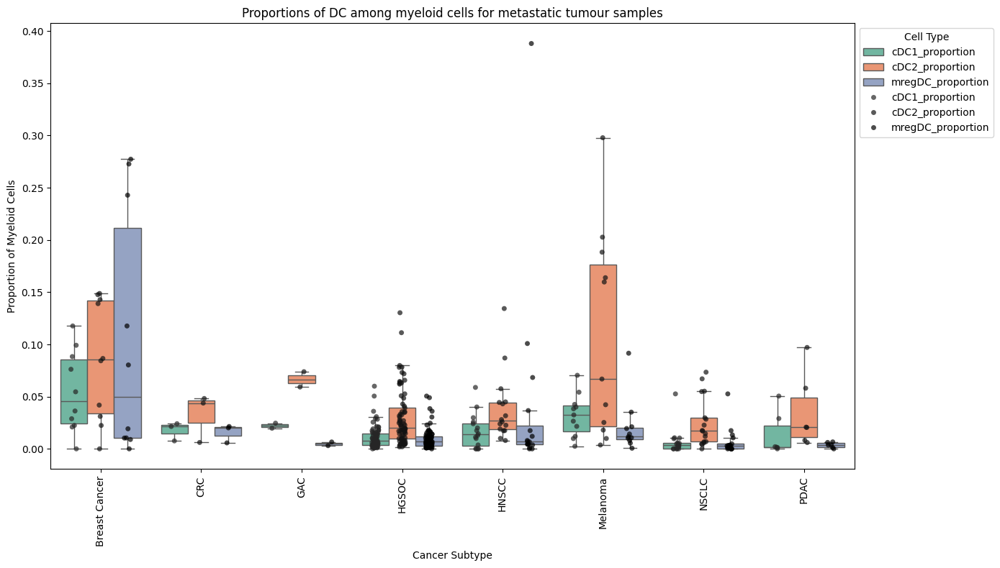

In [37]:
# Set up the plot
plt.figure(figsize=(14, 8))

# Create the grouped box plot and assign the axis to box_ax
box_ax = sns.boxplot(
    x="cancer_type_broad", y="Proportion", hue="Cell_Type", 
    data=proportion_non_nan, 
    palette="Set2",  # Customize the color palette
    showfliers=False  # Optionally hide outliers
)

# Overlay individual data points as a scatter (strip plot)
sns.stripplot(
    x="cancer_type_broad", y="Proportion", hue="Cell_Type", data=proportion_non_nan,
    color="black", size=5, jitter=True, alpha=0.7, dodge=True  # Adjust appearance of data points
)

# Customize plot labels
plt.ylabel("Proportion of Myeloid Cells")
plt.xlabel("Cancer Subtype")
plt.title("Proportions of DC among myeloid cells for metastatic tumour samples")

# Make x-axis labels vertical for readability if needed
plt.xticks(rotation=90)

# Adjust legend position
plt.legend(title="Cell Type", loc="upper left", bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

### should I show with BC not grouped??

### Note: mets represents multiple sites

## Repeat for healthy:

### Calculate the proportion of each DC type per sample and site: 

In [14]:
# Create a DataFrame containing just sample, subtype and annotations 
df = data_H.obs[["integration_id", "site", "NR_annotations_simple"]].copy()

# Create a new column for each DC type, indicating whether each cell belongs to that type (True vs False)
df["is_cDC1"] = df["NR_annotations_simple"] == "cDC1"
df["is_cDC2"] = df["NR_annotations_simple"] == "cDC2"
df["is_mregDC"] = df["NR_annotations_simple"] == "mregDC"

# Calculate proportions of each DC type per sample within each cancer subtype
proportion_df = (
    df.groupby(["integration_id", "site"])[["is_cDC1", "is_cDC2", "is_mregDC"]] #groups dataframe by each unique combo of sample_id and cancer type, keeps the booleen columns 
    .mean() #calculating the mean of a booleen column gives the proportion of true values 
    .reset_index()
    .rename(columns={"is_cDC1": "cDC1_proportion", "is_cDC2": "cDC2_proportion", "is_mregDC": "mregDC_proportion"}) #rename eg. is_cDC1 column to cDC1_proportion
)

#now have a dataframe containing proportion of each DC type for every sample and cancer type
proportion_df.head(15)

/scratch/temp/11909541/ipykernel_1820536/233535826.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,integration_id,site,cDC1_proportion,cDC2_proportion,mregDC_proportion
0,GSE131907_Healthy_N0001,breast,NaN,NaN,NaN
1,GSE131907_Healthy_N0001,colon,NaN,NaN,NaN
2,GSE131907_Healthy_N0001,liver,NaN,NaN,NaN
3,GSE131907_Healthy_N0001,lung,0.008306,0.041528,0.009967
4,GSE131907_Healthy_N0001,lymph node,NaN,NaN,NaN
5,GSE131907_Healthy_N0001,ovary,NaN,NaN,NaN
6,GSE131907_Healthy_N0006,breast,NaN,NaN,NaN
7,GSE131907_Healthy_N0006,colon,NaN,NaN,NaN
8,GSE131907_Healthy_N0006,liver,NaN,NaN,NaN
9,GSE131907_Healthy_N0006,lung,0.004866,0.017032,0.005677


In [15]:
# Melt the DataFrame to "long" format for seaborn plotting
proportion_df_long = proportion_df.melt(
    id_vars=["integration_id", "site"], 
    value_vars=["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"],
    var_name="Cell_Type",
    value_name="Proportion"
)

proportion_df_long.head(15)

,integration_id,site,Cell_Type,Proportion
0,GSE131907_Healthy_N0001,breast,cDC1_proportion,NaN
1,GSE131907_Healthy_N0001,colon,cDC1_proportion,NaN
2,GSE131907_Healthy_N0001,liver,cDC1_proportion,NaN
3,GSE131907_Healthy_N0001,lung,cDC1_proportion,0.008306
4,GSE131907_Healthy_N0001,lymph node,cDC1_proportion,NaN
5,GSE131907_Healthy_N0001,ovary,cDC1_proportion,NaN
6,GSE131907_Healthy_N0006,breast,cDC1_proportion,NaN
7,GSE131907_Healthy_N0006,colon,cDC1_proportion,NaN
8,GSE131907_Healthy_N0006,liver,cDC1_proportion,NaN
9,GSE131907_Healthy_N0006,lung,cDC1_proportion,0.004866


In [16]:
#export proportion_df_long 
proportion_df_long.to_excel("2024-12-07_DC_prop_healthy.xlsx", index=False)

### Perform ANOVA to compare the proportion of each DC type between cancer types

In [45]:
# Drop rows where "Proportion" is NaN
proportion_non_nan = proportion_df_long.dropna(subset=["Proportion"])

In [46]:
results_anova = {} #define a dictionary to store anova results in

for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type] #subset the data by cell type
    model = ols("Proportion ~ site", data=subset).fit() #Define the model: Proportion ~ cancer_type_broad
    anova_results = sm.stats.anova_lm(model, typ=2) #perform anova
    results_anova[cell_type] = anova_results #store results
    print(f"ANOVA for {cell_type}:\n{anova_results}\n")

ANOVA for cDC1_proportion:
            sum_sq    df          F        PR(>F)
site      0.009355   5.0  10.756955  5.657129e-07
Residual  0.008349  48.0        NaN           NaN

ANOVA for cDC2_proportion:
            sum_sq    df          F        PR(>F)
site      0.340221   5.0  44.693066  6.297603e-17
Residual  0.073079  48.0        NaN           NaN

ANOVA for mregDC_proportion:
            sum_sq    df          F        PR(>F)
site      0.073985   5.0  31.214914  5.343934e-14
Residual  0.022754  48.0        NaN           NaN



In [47]:
# perform Tukey's multiple comparison test
results_T = {}

for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type]
    tukey = pairwise_tukeyhsd(endog=subset["Proportion"], groups=subset["site"], alpha=0.05)
    results_T[cell_type] = tukey.summary()
    print(f"Tukey's HSD for {cell_type}:\n{tukey.summary()}\n")

Tukey's HSD for cDC1_proportion:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
  group1     group2   meandiff p-adj   lower   upper  reject
------------------------------------------------------------
    breast      colon   0.0068 0.9706 -0.0194  0.0331  False
    breast      liver   0.0225 0.1323 -0.0038  0.0487  False
    breast       lung    0.006 0.9292 -0.0127  0.0248  False
    breast lymph node   0.0593    0.0  0.0308  0.0879   True
    breast      ovary   0.0198 0.2409 -0.0065   0.046  False
     colon      liver   0.0156 0.5529  -0.012  0.0433  False
     colon       lung  -0.0008    1.0 -0.0215  0.0199  False
     colon lymph node   0.0525 0.0001  0.0226  0.0824   True
     colon      ovary   0.0129 0.7345 -0.0147  0.0406  False
     liver       lung  -0.0164 0.1913 -0.0371  0.0042  False
     liver lymph node   0.0369 0.0078   0.007  0.0668   True
     liver      ovary  -0.0027 0.9997 -0.0304   0.025  False
      lung lymph node   0.0533    0.0  0.0297  0.076

### Plot as boxplots:

/scratch/temp/11802321/ipykernel_2360467/1960967880.py:13: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.



p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

liver vs. lung: Custom statistical test, P_val:-1.270e-02
lung vs. lymph node: Custom statistical test, P_val:-6.500e-03
breast vs. colon: Custom statistical test, P_val:2.260e-02
lymph node vs. ovary: Custom statistical test, P_val:-3.040e-02
colon vs. liver: Custom statistical test, P_val:2.970e-02
lung vs. ovary: Custom statistical test, P_val:-3.800e-03
colon vs. lung: Custom statistical test, P_val:3.080e-02
breast vs. liver: Custom statistical test, P_val:-2.150e-02
liver vs. lymph node: Custom statistical test, P_val:-7.000e-03
breast vs. lung: Custom statistical test, P_val:-1.940e-02
liver vs. ovary: Custom statistical test, P_val:-3.710e-02
colon vs. lymph node: Custom statistical test, P_val:-6.950e-02
breast vs. lymph node: Custom statistical test, P_val:-1.470e-02
colon vs. ovary: Cus

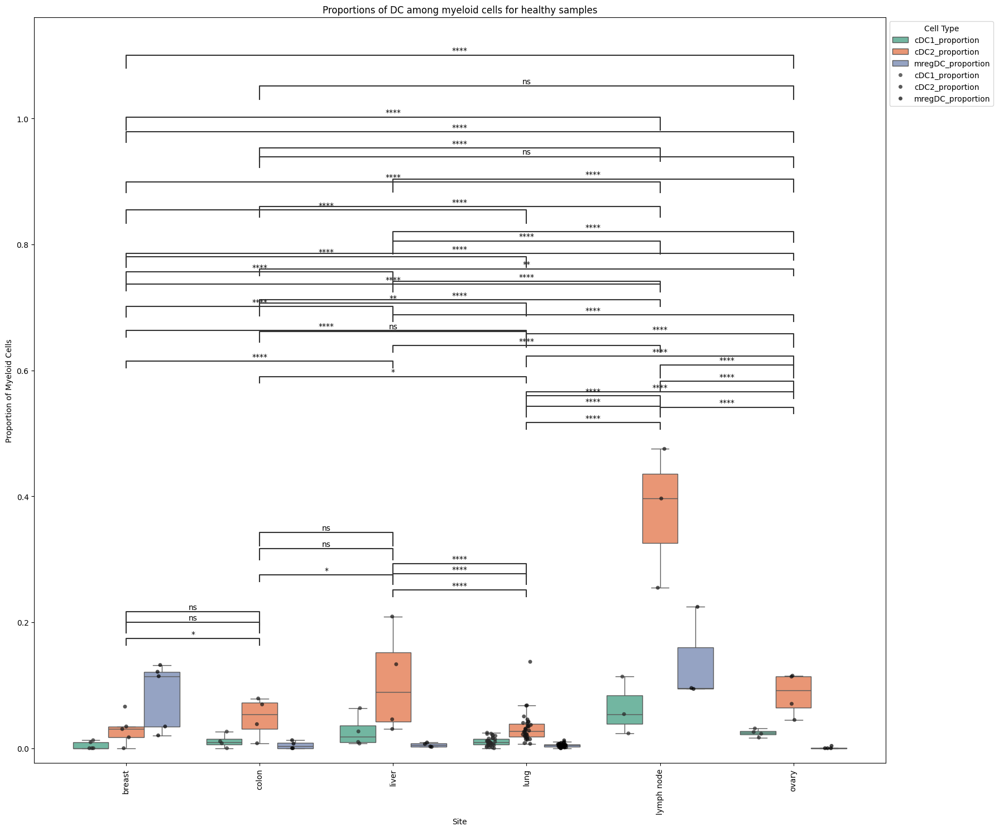

In [50]:
# Set up the plot
plt.figure(figsize=(18, 15))

# Create the grouped box plot and assign the axis to box_ax
box_ax = sns.boxplot(
    x="site", y="Proportion", hue="Cell_Type", 
    data=proportion_non_nan, 
    palette="Set2",  # Customize the color palette
    showfliers=False  # Optionally hide outliers
)

# Overlay individual data points as a scatter (strip plot)
sns.stripplot(
    x="site", y="Proportion", hue="Cell_Type", data=proportion_non_nan,
    color="black", size=5, jitter=True, alpha=0.7, dodge=True  # Adjust appearance of data points
)

# Generate all possible pairs of cancer types
cancer_types = proportion_non_nan["site"].unique()
pairs = list(itertools.combinations(cancer_types, 2))

# Loop over each cell type and add significance annotations
for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:

    # Fetch Tukey's results from the previous analysis
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type]
    tukey = pairwise_tukeyhsd(
        endog=subset["Proportion"], 
        groups=subset["site"], 
        alpha=0.05
    )
    
    # Extract p-values from Tukey's HSD test summary
    tukey_summary = tukey.summary().data  # Access the summary data
    pvalues = [row[4] for row in tukey_summary[1:]]  # Extract p-values (ignoring the first row, which is the header)

    # Define the annotations (this assumes the results are structured as shown in your previous output)
    annotator = Annotator(
        box_ax, pairs, data=proportion_non_nan, x="site", y="Proportion"
    )
    
    # Use p-values from the Tukey test to annotate the plot
    annotator.set_pvalues(pvalues)
    annotator.annotate()

# Customize plot labels
plt.ylabel("Proportion of Myeloid Cells")
plt.xlabel("Site")
plt.title("Proportions of DC among myeloid cells for healthy samples")

# Make x-axis labels vertical for readability if needed
plt.xticks(rotation=90)

# Adjust legend position
plt.legend(title="Cell Type", loc="upper left", bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

/scratch/temp/11802321/ipykernel_2360467/3199902186.py:13: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.



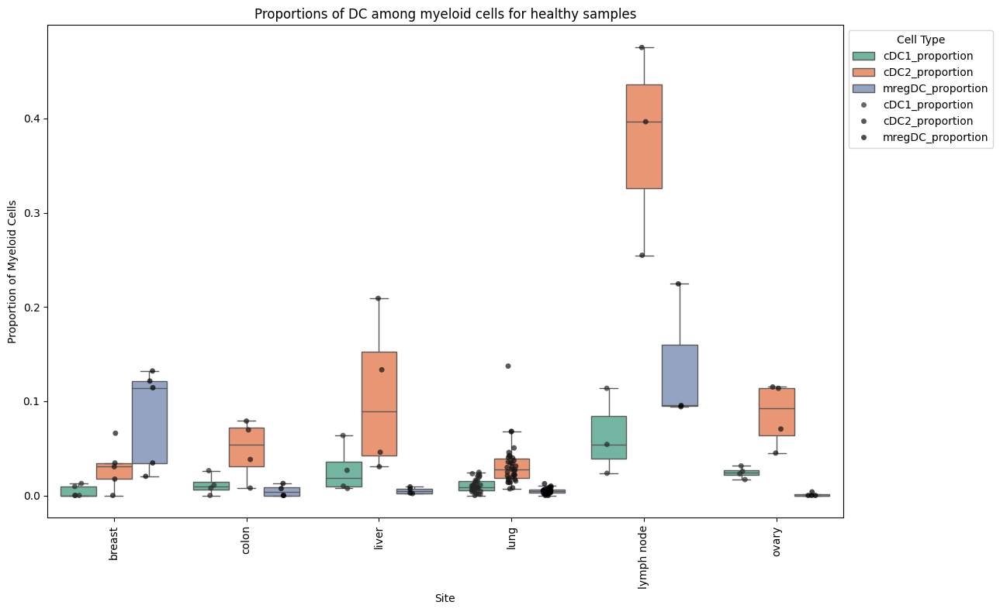

In [51]:
# Set up the plot
plt.figure(figsize=(13, 8))

# Create the grouped box plot and assign the axis to box_ax
box_ax = sns.boxplot(
    x="site", y="Proportion", hue="Cell_Type", 
    data=proportion_non_nan, 
    palette="Set2",  # Customize the color palette
    showfliers=False  # Optionally hide outliers
)

# Overlay individual data points as a scatter (strip plot)
sns.stripplot(
    x="site", y="Proportion", hue="Cell_Type", data=proportion_non_nan,
    color="black", size=5, jitter=True, alpha=0.7, dodge=True  # Adjust appearance of data points
)

# Customize plot labels
plt.ylabel("Proportion of Myeloid Cells")
plt.xlabel("Site")
plt.title("Proportions of DC among myeloid cells for healthy samples")

# Make x-axis labels vertical for readability if needed
plt.xticks(rotation=90)

# Adjust legend position
plt.legend(title="Cell Type", loc="upper left", bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

# Plot DC proportions specifically for OC

### Calculate the proportion of each DC type per sample and sample type: 

In [17]:
# Create a DataFrame containing just sample, sample_type and annotations 
df = data_OC.obs[["integration_id", "sample_type_major2", "NR_annotations_simple"]].copy()

# Create a new column for each DC type, indicating whether each cell belongs to that type (True vs False)
df["is_cDC1"] = df["NR_annotations_simple"] == "cDC1"
df["is_cDC2"] = df["NR_annotations_simple"] == "cDC2"
df["is_mregDC"] = df["NR_annotations_simple"] == "mregDC"

# Calculate proportions of each DC type per sample within each cancer subtype
proportion_df = (
    df.groupby(["integration_id", "sample_type_major2"])[["is_cDC1", "is_cDC2", "is_mregDC"]] #groups dataframe by each unique combo of sample_id and cancer type, keeps the booleen columns 
    .mean() #calculating the mean of a booleen column gives the proportion of true values 
    .reset_index()
    .rename(columns={"is_cDC1": "cDC1_proportion", "is_cDC2": "cDC2_proportion", "is_mregDC": "mregDC_proportion"}) #rename eg. is_cDC1 column to cDC1_proportion
)

#now have a dataframe containing proportion of each DC type for every sample and cancer type
proportion_df.head(15)

/scratch/temp/11909541/ipykernel_1820536/3277235809.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,integration_id,sample_type_major2,cDC1_proportion,cDC2_proportion,mregDC_proportion
0,GSE180661_SPECTRUM-OV-002_S1_CD45P_INFRACOLIC_...,ascites,NaN,NaN,NaN
1,GSE180661_SPECTRUM-OV-002_S1_CD45P_INFRACOLIC_...,healthy,NaN,NaN,NaN
2,GSE180661_SPECTRUM-OV-002_S1_CD45P_INFRACOLIC_...,metastatic tumour,0.000000,0.040816,0.006803
3,GSE180661_SPECTRUM-OV-002_S1_CD45P_INFRACOLIC_...,primary tumour,NaN,NaN,NaN
4,GSE180661_SPECTRUM-OV-002_S1_CD45P_RIGHT_OVARY,ascites,NaN,NaN,NaN
5,GSE180661_SPECTRUM-OV-002_S1_CD45P_RIGHT_OVARY,healthy,NaN,NaN,NaN
6,GSE180661_SPECTRUM-OV-002_S1_CD45P_RIGHT_OVARY,metastatic tumour,NaN,NaN,NaN
7,GSE180661_SPECTRUM-OV-002_S1_CD45P_RIGHT_OVARY,primary tumour,0.003945,0.031558,0.001972
8,GSE180661_SPECTRUM-OV-003_S1_UNSORTED_INFRACOL...,ascites,NaN,NaN,NaN
9,GSE180661_SPECTRUM-OV-003_S1_UNSORTED_INFRACOL...,healthy,NaN,NaN,NaN


In [18]:
# Melt the DataFrame to "long" format for seaborn plotting
proportion_df_long = proportion_df.melt(
    id_vars=["integration_id", "sample_type_major2"], 
    value_vars=["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"],
    var_name="Cell_Type",
    value_name="Proportion"
)

proportion_df_long.head(15)

,integration_id,sample_type_major2,Cell_Type,Proportion
0,GSE180661_SPECTRUM-OV-002_S1_CD45P_INFRACOLIC_...,ascites,cDC1_proportion,NaN
1,GSE180661_SPECTRUM-OV-002_S1_CD45P_INFRACOLIC_...,healthy,cDC1_proportion,NaN
2,GSE180661_SPECTRUM-OV-002_S1_CD45P_INFRACOLIC_...,metastatic tumour,cDC1_proportion,0.000000
3,GSE180661_SPECTRUM-OV-002_S1_CD45P_INFRACOLIC_...,primary tumour,cDC1_proportion,NaN
4,GSE180661_SPECTRUM-OV-002_S1_CD45P_RIGHT_OVARY,ascites,cDC1_proportion,NaN
5,GSE180661_SPECTRUM-OV-002_S1_CD45P_RIGHT_OVARY,healthy,cDC1_proportion,NaN
6,GSE180661_SPECTRUM-OV-002_S1_CD45P_RIGHT_OVARY,metastatic tumour,cDC1_proportion,NaN
7,GSE180661_SPECTRUM-OV-002_S1_CD45P_RIGHT_OVARY,primary tumour,cDC1_proportion,0.003945
8,GSE180661_SPECTRUM-OV-003_S1_UNSORTED_INFRACOL...,ascites,cDC1_proportion,NaN
9,GSE180661_SPECTRUM-OV-003_S1_UNSORTED_INFRACOL...,healthy,cDC1_proportion,NaN


In [19]:
#export proportion_df_long 
proportion_df_long.to_excel("2024-12-07_DC_prop_OC.xlsx", index=False)

### Perform ANOVA to compare the proportion of each DC type between sample types

In [55]:
# Drop rows where "Proportion" is NaN
proportion_non_nan = proportion_df_long.dropna(subset=["Proportion"])

In [56]:
results_anova = {} #define a dictionary to store anova results in

for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type] #subset the data by cell type
    model = ols("Proportion ~ sample_type_major2", data=subset).fit() #Define the model: Proportion ~ cancer_type_broad
    anova_results = sm.stats.anova_lm(model, typ=2) #perform anova
    results_anova[cell_type] = anova_results #store results
    print(f"ANOVA for {cell_type}:\n{anova_results}\n")

ANOVA for cDC1_proportion:
                      sum_sq     df          F        PR(>F)
sample_type_major2  0.039371    3.0  18.705743  1.534625e-10
Residual            0.119970  171.0        NaN           NaN

ANOVA for cDC2_proportion:
                      sum_sq     df          F        PR(>F)
sample_type_major2  0.103826    3.0  23.897786  5.756162e-13
Residual            0.247641  171.0        NaN           NaN

ANOVA for mregDC_proportion:
                      sum_sq     df         F    PR(>F)
sample_type_major2  0.000760    3.0  1.664192  0.176589
Residual            0.026037  171.0       NaN       NaN



In [57]:
# perform Tukey's multiple comparison test
results_T = {}

for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type]
    tukey = pairwise_tukeyhsd(endog=subset["Proportion"], groups=subset["sample_type_major2"], alpha=0.05)
    results_T[cell_type] = tukey.summary()
    print(f"Tukey's HSD for {cell_type}:\n{tukey.summary()}\n")

Tukey's HSD for cDC1_proportion:
           Multiple Comparison of Means - Tukey HSD, FWER=0.05            
      group1            group2      meandiff p-adj   lower   upper  reject
--------------------------------------------------------------------------
          ascites           healthy  -0.0282 0.1942 -0.0648  0.0085  False
          ascites metastatic tumour  -0.0413    0.0 -0.0564 -0.0262   True
          ascites    primary tumour  -0.0392    0.0 -0.0544  -0.024   True
          healthy metastatic tumour  -0.0131 0.7691 -0.0484  0.0222  False
          healthy    primary tumour  -0.0111 0.8488 -0.0464  0.0243  False
metastatic tumour    primary tumour   0.0021 0.9663 -0.0095  0.0136  False
--------------------------------------------------------------------------

Tukey's HSD for cDC2_proportion:
           Multiple Comparison of Means - Tukey HSD, FWER=0.05            
      group1            group2      meandiff p-adj   lower   upper  reject
---------------------------------

### Plot as boxplots:

/scratch/temp/11802321/ipykernel_2360467/609423967.py:13: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.



p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

metastatic tumour vs. primary tumour: Custom statistical test, P_val:-6.480e-02
healthy vs. metastatic tumour: Custom statistical test, P_val:-5.440e-02
ascites vs. healthy: Custom statistical test, P_val:-9.500e-03
ascites vs. metastatic tumour: Custom statistical test, P_val:-5.640e-02
healthy vs. primary tumour: Custom statistical test, P_val:-4.640e-02
ascites vs. primary tumour: Custom statistical test, P_val:-4.840e-02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

metastatic tumour vs. primary tumour: Custom statistical test, P_val:-5.610e-02
healthy vs. metastatic tumour: Custom statistical test, P_val:-8.690e-02
ascites vs. healthy: Custom statis

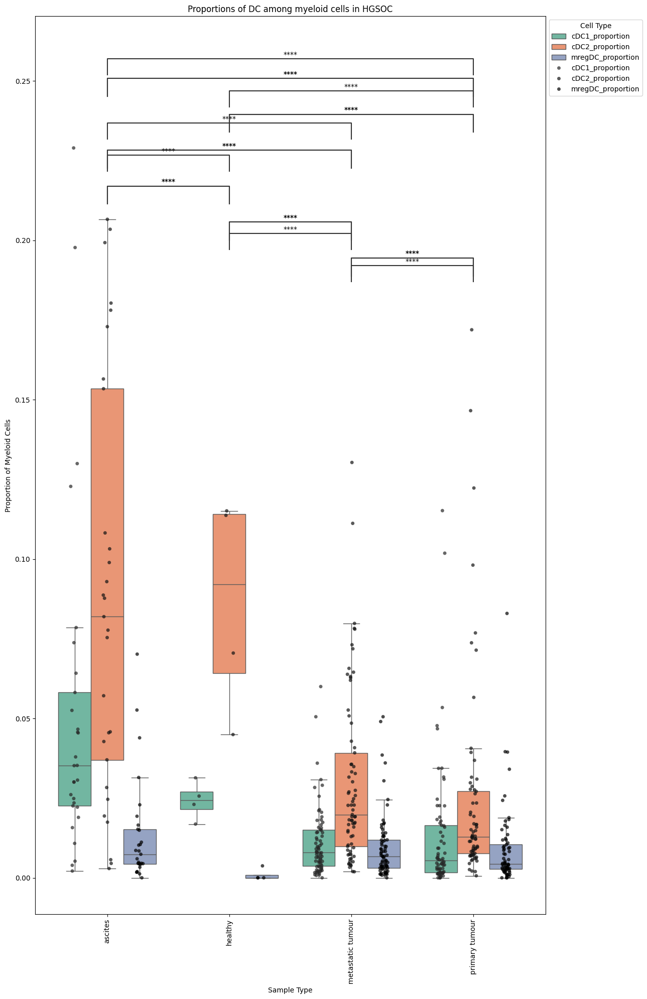

In [58]:
# Set up the plot
plt.figure(figsize=(13, 20))

# Create the grouped box plot and assign the axis to box_ax
box_ax = sns.boxplot(
    x="sample_type_major2", y="Proportion", hue="Cell_Type", 
    data=proportion_non_nan, 
    palette="Set2",  # Customize the color palette
    showfliers=False  # Optionally hide outliers
)

# Overlay individual data points as a scatter (strip plot)
sns.stripplot(
    x="sample_type_major2", y="Proportion", hue="Cell_Type", data=proportion_non_nan,
    color="black", size=5, jitter=True, alpha=0.7, dodge=True  # Adjust appearance of data points
)

# Generate all possible pairs of cancer types
cancer_types = proportion_non_nan["sample_type_major2"].unique()
pairs = list(itertools.combinations(cancer_types, 2))

# Loop over each cell type and add significance annotations
for cell_type in ["cDC1_proportion", "cDC2_proportion", "mregDC_proportion"]:

    # Fetch Tukey's results from the previous analysis
    subset = proportion_non_nan[proportion_non_nan["Cell_Type"] == cell_type]
    tukey = pairwise_tukeyhsd(
        endog=subset["Proportion"], 
        groups=subset["sample_type_major2"], 
        alpha=0.05
    )
    
    # Extract p-values from Tukey's HSD test summary
    tukey_summary = tukey.summary().data  # Access the summary data
    pvalues = [row[4] for row in tukey_summary[1:]]  # Extract p-values (ignoring the first row, which is the header)

    # Define the annotations (this assumes the results are structured as shown in your previous output)
    annotator = Annotator(
        box_ax, pairs, data=proportion_non_nan, x="sample_type_major2", y="Proportion"
    )
    
    # Use p-values from the Tukey test to annotate the plot
    annotator.set_pvalues(pvalues)
    annotator.annotate()

# Customize plot labels
plt.ylabel("Proportion of Myeloid Cells")
plt.xlabel("Sample Type")
plt.title("Proportions of DC among myeloid cells in HGSOC")

# Make x-axis labels vertical for readability if needed
plt.xticks(rotation=90)

# Adjust legend position
plt.legend(title="Cell Type", loc="upper left", bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

/scratch/temp/11802321/ipykernel_2360467/3961553843.py:13: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.



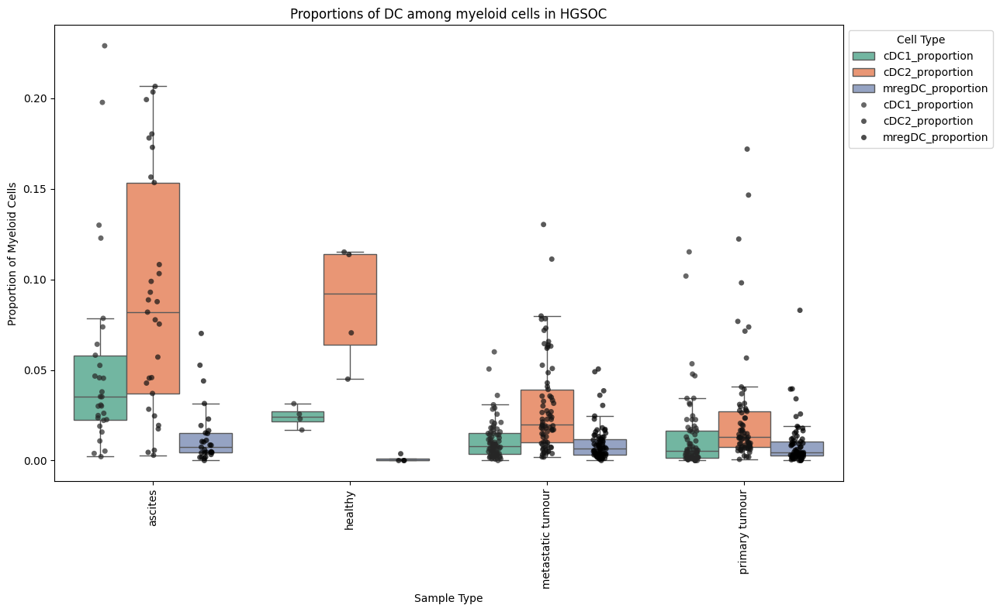

In [64]:
# Set up the plot
plt.figure(figsize=(13, 8))

# Create the grouped box plot and assign the axis to box_ax
box_ax = sns.boxplot(
    x="sample_type_major2", y="Proportion", hue="Cell_Type", 
    data=proportion_non_nan, 
    palette="Set2",  # Customize the color palette
    showfliers=False  # Optionally hide outliers
)

# Overlay individual data points as a scatter (strip plot)
sns.stripplot(
    x="sample_type_major2", y="Proportion", hue="Cell_Type", data=proportion_non_nan,
    color="black", size=5, jitter=True, alpha=0.7, dodge=True  # Adjust appearance of data points
)

# Customize plot labels
plt.ylabel("Proportion of Myeloid Cells")
plt.xlabel("Sample Type")
plt.title("Proportions of DC among myeloid cells in HGSOC")

# Make x-axis labels vertical for readability if needed
plt.xticks(rotation=90)

# Adjust legend position
plt.legend(title="Cell Type", loc="upper left", bbox_to_anchor=(1, 1))

# Show plot
plt.tight_layout()
plt.show()

# overlay select gene sets on UMAP
* to support annotations
* note: not all genes present in gene sets are in my atlas

In [28]:
#define gene sets for Yolk sac derived vs HSC derived macs (from Kelvin)
YS_sig = ['PF4','MMP9','E130306D19RIK','CADM1','IRAK1','SH3YL1','DNAJB6','EPCAM','CHR10:117021051-117038683_F','ECD','PFKP','FABP4','MS4A7','DCAKD','GPS1','TRNAU1AP','AGPAT3','DNAJB6','CHR4:145000941-145148666_F','GPS1','SAE1','FOSB','CHR8:91569369-91594119_R','HOXC4','FOLR2','TUBB2A-PS2','GPS1','CHR8:91569369-91594119_R','BAZ1B','OST4','CHR8:72076364-72077503_R','PTPRA','PLOD1','4930555G01RIK','PHF5A','CHR17:95158347-95160942_F','CHR8:48476637-48492537_F','CHR14:44284425-44300475_F','TC1660977','NMD3','PLAU','BTF3L4','CHR17:33995525-34028025_F','CDK2','FCRLS','1110017F19RIK','MAPK9','GDPD1','CHR2:155269145-155303251_F','FBXO30','TRNAU1AP','MRC1','FAM98B','AV575311','CHR17:95158347-95160942_F','CCDC18','ANLN','CTBP2','ACSM3','S1PR1','PXDN','MAN1A','COX6A1','SLC43A3','CCDC47','FAM178A','TNS3','NAP102625-1','PLEKHG5','NDUFS4','CHR10:14888108-14978308_R','UBE2Z','B3GALNT1','TBC1D19','AK007267','MRTO4','TRAIP','CEP55','CHR10:117021051-117038683_R','CHR10:117021051-117038683_R','UTP20','CHR2:108382077-108441137_R','STMN1','4930534B04RIK','CHR14:44146705-44149729_R','CHR10:117021051-117038683_F','STAB1','SMARCAD1','CHR18:78190463-78235438_R','NAP111768-1','CHR5:121768672-121772658_F','CTSB','MAN2B2','PTN','SLC30A7','LHFPL2','CXCL2','RALGDS','CHR4:133368314-133380210_F','CHR8:19682258-19700836_F','A_55_P2169539','CHR7:99879368-99889978_F','ABCB8','NDRG3','PEG3','NUF2','SENP5','SLC35D1','AI462493','RILPL1','CHR2:108382077-108441137_R','NDUFV1','AHSA1']
HSC_sig = ['TTLL3','FAM55D','6330418K02RIK','GDA','GPR35','IFITM6','XDH','8430419L09RIK','PIRA11','CD74','LOC100038947','MBP','S100A8','GM10693','F12','PID1','A_55_P2184200','CCR2','LILRA6','ETOHI1','PNRC1','ARHGEF37','UBP1','TREML4','VMN1R174','POLR1E','ART2A-PS','CYTIP','TEAD1','KLRA2','GZF1','PLAC8','ENSMUST00000103299','RASGRP4','KLF13','PLBD1','CHR2:128249388-128250301_F','PIRA6','MPG','DENND1C','SMPDL3A','DGKG','ENSMUST00000050386','LIME1','HIST1H2BP','1700112J16RIK','OASL2','PTHLH','AHNAK','CHR3:79069438-79073704_R','A_55_P2050722','KYNU','RAC2','TCTEX1D2','SELL','KLRA9','CHR10:66559716-66647841_R']

#define DC subset gene sets from Villani et al 
DC1_sig = ['CLEC9A','C1ORF54','HLA-DPA1','CADM1','CAMK2D','CPVL','HLA-DPB2','WDFY4','CPNE3','IDO1','HLA-DPB1','LOC645638','HLA-DOB','HLA-DQB1','HLA-DQB','CLNK','CSRP1','SNX3','ZNF366','KIAA1598','NDRG2','ENPP1','RGS10','AX747832','CYB5R3','ID2','XCR1','FAM190A','ASAP1','SLAMF8','CD59','DHRS3','GCET2','FNBP1','TMEM14A','NET1','BTLA','BCL6','FLT3','ADAM28','SLAMF7','BATF3','LGALS2','VAC14','PPA1','APOL3','C1ORF21','CCND1','ANPEP','ELOVL5','NCALD','ACTN1','PIK3CB','HAVCR2','GYPC','TLR10','ASB2','KIF16B','LRRC18','DST','DENND1B','DNASE1L3','SLC24A4','VAV3','THBD','NAV1','GSTM4','TRERF1','B3GNT7','LACC1','LMNA','PTK2','IDO2','MTERFD3','CD93','DPP4','SLC9A9','FCRL6','PDLIM7','CYP2E1','PDE4DIP','LIMA1','CTTNBP2NL','PPM1M','OSBPL3','PLCD1','CD38','EHD4','ACSS2','LOC541471','FUCA1','SNX22','APOL1','DUSP10','FAM160A2','INF2','DUSP2','PALM2','RAB11FIP4','DSE','FAM135A','KCNK6','PPM1H','PAFAH1B3','PDLIM1','TGM2','SCARF1','CD40','STX3','WHAMMP3','PRELID2','PQLC2']
DC2_sig = ['CD1C','FCER1A','CLEC10A','ADAM8','CD1D','FCGR2B','CLEC4A','SLC2A3','CD33','ETS2','CLIC2','PEA15','CACNA2D3','CD1E','MBOAT7','C10ORF128','NR4A2','AGPAT9','ENTPD1','CD2','PER1','PID1','AREG','PTGS1','SMA','CLEC17A','ITGA5','CREB5','PTAFR','NOD2','CCR6']
DC3_sig = ['S100A9','S100A8','VCAN','LYZ','ANXA1','PLBD1','RNASE2','FCER1A','SLC2A3','CD163','CSF3R','MNDA','CD14','NAIP','CSTA','FCN1','CD1D','FPR1','F13A1','CLEC10A','CES1','PID1','S100A12','MTMR11','SMA','LAT2','RETN','TMEM173','AOAH','RAB3D','CD36','MGST1','TREM1','HNMT','CES1P1','ADAM15','IL13RA1','MICAL2','ITGA5','CREB5','IL1B','NR4A2','MPP7','PTAFR','HBEGF','NFE2','ASGR1','BST1','IL1RN','NOD2','NLRP3','DQ575504','LMNA','C9ORF89','IL27RA','NLRP12','RAB27A','EREG','LOC284454']

#mregDC sig from Merad
mregDC_sig = ['CD40','CD80','CD86','RELB','CD83','CD274','PDCD1LG2','CD200','FAS','ALDH1A2','SOCS1','SOCS2','CCR7','MYO1G','CXCL16','ADAM8','ICAM1','FSCN1','MARCKS','MARCKSL1','IL4RA','IL4I1','CCL17','CCL22','TNFRSF4','STAT6','BCL2L1']

#cDC1 derived mregDC vs cDC2 derived mregDC from Cheng
cDC1_mregDC = ['GPR153','SLC2A5','GPR157','PRDM2','PADI2','ECE1','TMEM57','MARCKSL1','MACF1','CDKN2C','TACSTD2','ROR1','IL23R','GADD45A','MCOLN2','RHOC','PPM1J','MAGI3','ATP1A1','FAM46C','ACP6','C1orf54','ENSA','S100A10','DCAF6','RABGAP1L','C1orf21','FAM129A','RGS1','RGS13','TNNT2','LAD1','NAV1','RAB7B','BATF3','CDC42BPA','C1orf198','KIF26B','LINC00298','ID2','GEN1','RAB10','RASGRP3','MAP4K3','MTA3','FOXN2','RTN4','PELI1','LGALSL','AFTPH','PCBP1','TEX261','NEURL3','TBC1D8','MAP4K4','BCL2L11','FOXD4L1','CYTIP','LY75','TANK','TTN-AS1','TTN','ITGA4','PPP1R1C','NABP1','RAPH1','AC079767.4','PIKFYVE','IKZF2','SP140','ATG16L1','RAMP1','FARP2','ING5','IRAK2','THRB','LRRFIP2','PLCD1','OXSR1','RP11-761N21.1','LZTFL1','FLNB','DNASE1L3','LRIG1','FOXP1','ROBO1','CBLB','GCSAM','CD200','BTLA','POGLUT1','PLXNA1','MGLL','SLC9A9','RAP2B','MAP3K13','LPP','CLNK','ARAP2','KLF3','LIMCH1','KIAA1211','RUFY3','GRSF1','MOB1B','G3BP2','PPM1K','TIGD2','DAPP1','H2AFZ','NOCT','IL15','INPP4B','SMARCA5','ZNF827','CASP3','CTD-2231H16.1','CCDC127','OTULIN','ANKRD55','GPBP1','KIF2A','ST8SIA4','CAMK4','EPB41L4A','SEMA6A','SLC12A2','FSTL4','ANXA6','SLC36A1','G3BP1','CYFIP2','RP11-524N5.1','IL12B','DUSP1','ERGIC1','ATP6V0E1','MGAT4B','SQSTM1','SERPINB9','TUBB2A','BTN2A2','HIST1H2BK','HLA-F','HLA-G','HLA-A','HLA-E','HLA-C','HLA-B','HLA-DOB','BRD2','DST','FAM135A','HMGN3','ZUFSP','NCOA7','PTPRK','EYA4','PPP1R14C','PLEKHG1','ZBTB2','TIAM2','GPR31','CCZ1','EIF2AK1','TSPAN13','CCDC126','H2AFV','LANCL2','VOPP1','TPST1','AUTS2','TFPI2','GNG11','COL1A2','MUC12','CDHR3','DNAJB9','TES','CAV1','ST7','TMSB4X','RAB9A','MOSPD2','ACOT9','DMD','CHST7','SLC9A7','PAGE2','KLF8','P2RY10','ZCCHC18','NXT2','WDR44','CXorf40A','CLIC2','FBXO25','SGK223','PNOC','DUSP4','RAB11FIP1','IDO1','NSMAF','TOX','RP11-25K19.1','HEY1','CPNE3','PABPC1','TRIB1','ST3GAL1','PTK2','ZNF250','FOXD4','ANKRD20A2','FAM95B1','ANKRD20A4','FOXD4L4','ANKRD20A3','ANKRD20A1','FOXD4L3','TJP2','NMRK1','OSTF1','RFK','GCNT1','CKS2','SEC61B','TXN','FNBP1','CLIC3','FUT7','GRIN1','ANO9','LSP1','RPL27A','RNF141','LYVE1','LDLRAD3','MDK','PLA2G16','NRXN2','MALAT1','KLC2','GSTP1','GDPD5','BIRC3','TMEM123','CADM1','TMEM136','NET1','UPF2','DHTKD1','OPTN','FRMD4A','ZEB1','MAPK8','WDFY4','CCDC6','JMJD1C-AS1','REEP3','H2AFY2','AIFM2','VDAC2','ENTPD7','ERLIN1','DUSP5','SHTN1','RP11-598F7.3','WNK1','CLEC2D','PRR4','BCL2L14','ATF7IP','OVOS2','RND1','TUBA1C','SPATS2','RAB5B','MYL6','DYRK2','NAP1L1','PAWR','NAA25','RAB35','USP12','RPL21','FLT3','ENOX1','LACC1','KIAA0226L','TBC1D4','MBNL2','EFNB2','ARHGAP5','NIN','DAAM1','DNAL1','PNMA1','SLC24A4','SLC25A29','CKB','IGHV6-1','MTMR10','B2M','MYEF2','FBN1','GABPB1','RPS27L','RAB8B','RPLP1','ARNT2','WHAMM','FAM174B','PDPK1','TXNDC11','ZC3H7A','ARHGAP17','NLRC5','WWP2','VAC14','ZNRF1','GABARAPL2','IRF8','VMO1','PFN1','ENO3','UBB','RAB11FIP4','C17orf96','CCR7','EIF1','RAMP2','CTD-2020K17.1','ERN1','ABCA5','TTYH2','HN1','C17orf99','CYTH1','ACTG1','TUBB6','MEX3C','TXNL1','MALT1','PMAIP1','TNFRSF11A','TSHZ1','ACSS2','TOMM34','STK4','EYA2','ZFAS1','RPS21','KISS1R','IZUMO4','AC024592.12','RPS28','CTC-548K16.1','HSH2D','CIB3','KCNN1','TBCB','SIPA1L3','FBXO17','FBXO27','CLASRP','ZNF296','HSD17B14','BID','ZNF280B','ADORA2A','APOBEC3B','ATF4','ENTHD1','GRAP2','RANGAP1','BIK','NRIP1','AJ006998.2','CYYR1','SOD1','TMEM50B','FAM3B','C2CD2']
cDC2_mregDC = ['TNFRSF14','KCNAB2','ENO1','PGD','AGTRAP','TMEM51','EFHD2','NECAP2','MINOS1','C1QA','C1QC','C1QB','SH3BGRL3','FGR','IFI6','THEMIS2','PTAFR','LAPTM5','AK2','ZMYM6NB','LSM10','CSF3R','UTP11L','ATP6V0B','PLK3','AKR1A1','SCP2','MAGOH','GBP1','GBP2','GBP4','GBP5','RPL5','DPYD','CD53','DRAM2','C1orf162','RAP1A','TXNIP','S100A11','S100A9','S100A6','S100A4','S100A13','LAMTOR2','LMNA','GLMP','CD1D','RP11-404O13.5','CD1A','CD1C','CD1B','CD1E','MNDA','IFI16','FCER1A','DUSP23','SLAMF8','IGSF8','PEA15','SLAMF1','FCER1G','FCGR2A','FCGR2B','RCSD1','ABL2','QSOX1','GLUL','RGS16','NCF2','PTPRC','RASSF5','IARS2','GUK1','NLRP3','CMPK2','LAPTM4A','TP53I3','SNX17','RBKS','PPP1CB','WDR43','EIF2AK2','GALM','SLC8A1','EML4','ZFP36L2','PNPT1','ACTR2','ARHGAP25','CLEC4F','CD207','DGUOK','HTRA2','DOK1','POLE4','CAPG','VAMP8','LINC00152','IGKV1-17','IGKV3-20','MRPS5','COX5B','IL1R2','LIMS1','IL1B','IL1RN','DBI','HNMT','KYNU','ZEB2','CD302','WIPF1','ATP5G3','ITGAV','STAT1','ANKRD44','FTCDNL1','ACSL3','SP140L','SP100','NCL','INPP5D','ARL4C','SH3BP5','CCRL2','GPX1','GNAI2','MAPKAPK3','ACY1','TWF2','TKT','MITF','FILIP1L','NDUFB4','HCLS1','CSTA','PLXND1','MRPL3','DNAJC13','RNF7','PLSCR1','HPS3','SERP1','EIF2A','P2RY13','SSR3','MFSD1','TNFSF10','NDUFB5','MCCC1','B3GNT5','AP2M1','CCDC50','ATP13A3','C4orf48','LRPAP1','LAP3','RBM47','OCIAD1','CXCL8','CXCL3','CXCL2','EREG','CXCL11','SCARB2','ANXA3','RASGEF1B','GPAT3','HSD17B11','PYURF','GPRIN3','AF213884.2','C4orf3','ANXA5','MGST2','MAML3','TLR2','FAM105A','SLC1A3','FYB','CCNH','MCTP1','GLRX','CAST','ERAP2','REEP5','SNX2','UQCRQ','H2AFY','TGFBI','TMEM173','HBEGF','SRA1','EIF4EBP3','CD14','CSF1R','SMIM3','LCP2','SH3PXD2B','CLTB','PRELID1','RNF130','NEDD9','UBD','IER3','LST1','AIF1','CLIC1','GPSM3','HLA-DQB1','HLA-DQA2','PSMB9','HLA-DMB','HLA-DMA','NUDT3','DEF6','FKBP5','TREM2','TREM1','CNPY3','VEGFA','NFKBIE','PLA2G7','CD109','SLC16A10','FAM26F','ARHGAP18','DYNLT1','SYTL3','TAGAP','SOD2','RNASET2','C7orf50','NUDT1','SNX8','MACC1','NFE2L3','SNX10','AOAH','INHBA','MRPS24','TNS3','FGL2','ARPC1B','ATP5J2','PILRA','FIS1','RASA4','RP11-325F22.2','SYPL1','DOCK4','CAPZA2','TBXAS1','GSTK1','TPK1','GIMAP4','TMEM176B','TMEM176A','PRKAG2-AS1','IL3RA','CD99','CYBB','ATP6AP2','CFP','WAS','LINC01420','VSIG4','COX7B','SH3BGRL','BTK','SLC25A5','FAM58A','BCAP31','IDH3G','ATP6AP1','CTSB','MSR1','ASAH1','ATP6V1B2','DOK2','MRPL15','TMEM70','LY96','DECR1','KLF10','ENY2','SLA','LY6E','GRINA','PDCD1LG2','TMEM261','PLIN2','HACD4','B4GALT1','FAM122A','ANXA1','FBP1','ABCA1','GNG10','SLC31A1','CDC26','ATP6V1G1','ENG','CARD9','TOR4A','IFITM2','IFITM1','IFITM3','CD81','PHLDA2','TRIM22','IPO7','C11orf58','NUCB2','LDHA','CAT','CD44','SPI1','SLC43A3','UBE2L6','C11orf31','CTNND1','LPXN','MS4A6A','MS4A4A','MS4A7','FTH1','RARRES3','BANF1','UNC93B1','NDUFS8','TCIRG1','ARRB1','PICALM','CTSC','SMCO4','TRPC6','CASP4','CASP1','CARD16','IL18','JAML','SORL1','ROBO3','DCPS','ST14','VPS26B','GDI2','ATP5C1','CDC123','CAMK1D','MRC1','PLXDC2','APBB1IP','ALOX5','FAM21C','NCOA4','PCBD1','PSAP','DDIT4','C10orf11','KCNMA1','ANXA11','GLUD1','ANKRD22','MYOF','ENTPD1','PIK3AP1','SFR1','GSTO1','CD9','GAPDH','CD4','TPI1','PTPN6','CD163','SLC2A3','C3AR1','CLEC4A','CLEC4E','A2M','CLEC2B','CLEC7A','OLR1','GABARAPL1','CREBL2','PLBD1','ARHGDIB','DERA','TMBIM6','PFDN5','C12orf10','AAAS','ATP5G2','ZNF385A','CD63','RPS26','PA2G4','ATP5B','CDK4','TSFM','GNS','TMBIM4','IRAK3','LYZ','GLIPR1','PHLDA1','NDUFA12','ARPC3','COX6A1','P2RX7','DENR','VPS37B','HMGB1','ALOX5AP','WBP4','RGCC','ITM2B','LPAR6','UBAC2','GPR183','RAB20','LAMP1','GAS6','OSGEP','APEX1','RNASE6','NDRG2','DAD1','OXA1L','SLC7A7','MMP14','HAUS4','C14orf119','DHRS4L2','NFKBIA','GNG2','RTN1','HIF1A','EIF2S1','NPC2','FCF1','CALM1','RIN3','SERPINA1','DICER1','TNFAIP2','SIVA1','PLD4','NOP10','SPRED1','THBS1','C15orf48','SQRDL','ANXA2','FAM96A','HEXA','UBL7','CTSH','IL16','TM6SF1','SEC11A','IDH2','CIB1','FAM195A','NDUFB10','IGSF6','PRKCB','SPN','TMEM219','ALDOA','YPEL3','BCKDK','PYCARD','ITGAX','LPCAT2','MT2A','MT1E','MT1F','MT1X','CCL17','KIFC3','CKLF','CMTM3','PSMB10','CMC2','COTL1','CYBA','APRT','SLC43A2','SCIMP','XAF1','CLEC10A','TNFSF12','TNFSF13','CD68','MAP2K3','VTN','CCL3','CCL4L2','COA3','IFI35','SLC25A39','GNGT2','ABI3','MRPL27','RP11-670E13.6','SCPEP1','MILR1','CD300A','CD300C','SPHK1','RHBDF2','SEPT9','LGALS3BP','SLC16A3','SECTM1','MYL12A','EPB41L3','VAPA','DSC2','PSTPIP2','FKBP1A','TMX4','XRN2','CD93','ERGIC3','SAMHD1','TGM2','MAFB','YWHAB','SDC4','SYS1','CTSA','MMP9','CEBPB','PMEPA1','SLCO4A1','RGS19','ATP5D','EBI3','SEMA6B','C3','STXBP2','TRAPPC5','MARCH2','DNMT1','ICAM1','CDC37','TMEM205','ACP5','MAN2B1','TRMT1','IL27RA','ADGRE5','NDUFB7','ADGRE2','OCEL1','ARRDC2','IFI30','FXYD5','USF2','HCST','TYROBP','YIF1B','EIF3K','GMFG','SNRPA','AXL','TGFB1','BCKDHA','CEACAM4','LYPD3','ETHE1','PLAUR','APOC4-APOC2','VASP','PTGIR','AP2S1','C5AR1','EMP3','FTL','TRPM4','CD37','FCGRT','ATF5','JOSD2','SIGLEC9','CD33','ETFB','FPR1','FPR2','FPR3','LILRB3','LILRB2','LAIR1','LILRB1','LILRB4','RPS4Y1','DDX3Y','COMT','IGLV4-69','IGLV1-44','IGLV2-14','IGLV2-8','CHCHD10','MIF','GGT5','SNRPD3','OSM','TCN2','APOL6','NCF4','RAC2','TOMM22','RPS19BP1','PHF5A','SNU13','NAGA','SMDT1','TSPO','PARVB','CERK','CTA-29F11.1','ATP5J','PIGP','ETS2','PDXK','ITGB2','MT-CO1','MT-ND5']

In [44]:
# Define dictionary of gene sets
gene_sets = {
    "YS_sig": YS_sig,
    "HSC_sig": HSC_sig,
    "DC1_sig": DC1_sig,
    "DC2_sig": DC2_sig,
    "DC3_sig": DC3_sig,
    "mregDC_sig": mregDC_sig,
    "cDC1_mregDC": cDC1_mregDC,
    "cDC2_mregDC": cDC2_mregDC
}

In [45]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data, genes, score_name=name)

       'CHR4:145000941-145148666_F', 'CHR8:91569369-91594119_R', 'TUBB2A-PS2',
       'CHR8:72076364-72077503_R', '4930555G01RIK',
       'CHR17:95158347-95160942_F', 'CHR8:48476637-48492537_F',
       'CHR14:44284425-44300475_F', 'TC1660977', 'CHR17:33995525-34028025_F',
       'FCRLS', '1110017F19RIK', 'CHR2:155269145-155303251_F', 'AV575311',
       'MAN1A', 'FAM178A', 'NAP102625-1', 'CHR10:14888108-14978308_R',
       'AK007267', 'CHR10:117021051-117038683_R', 'CHR2:108382077-108441137_R',
       '4930534B04RIK', 'CHR14:44146705-44149729_R',
       'CHR18:78190463-78235438_R', 'NAP111768-1',
       'CHR5:121768672-121772658_F', 'CHR4:133368314-133380210_F',
       'CHR8:19682258-19700836_F', 'A_55_P2169539', 'CHR7:99879368-99889978_F',
       'PEG3', 'AI462493'],
      dtype='object')
       'LOC100038947', 'GM10693', 'A_55_P2184200', 'ETOHI1', 'TREML4',
       'VMN1R174', 'ART2A-PS', 'KLRA2', 'ENSMUST00000103299',
       'CHR2:128249388-128250301_F', 'PIRA6', 'ENSMUST00000050386',

In [46]:
colour_vars = ["YS_sig","HSC_sig","DC1_sig","DC2_sig","DC3_sig","mregDC_sig","cDC1_mregDC","cDC2_mregDC","NR_annotations_simple"]

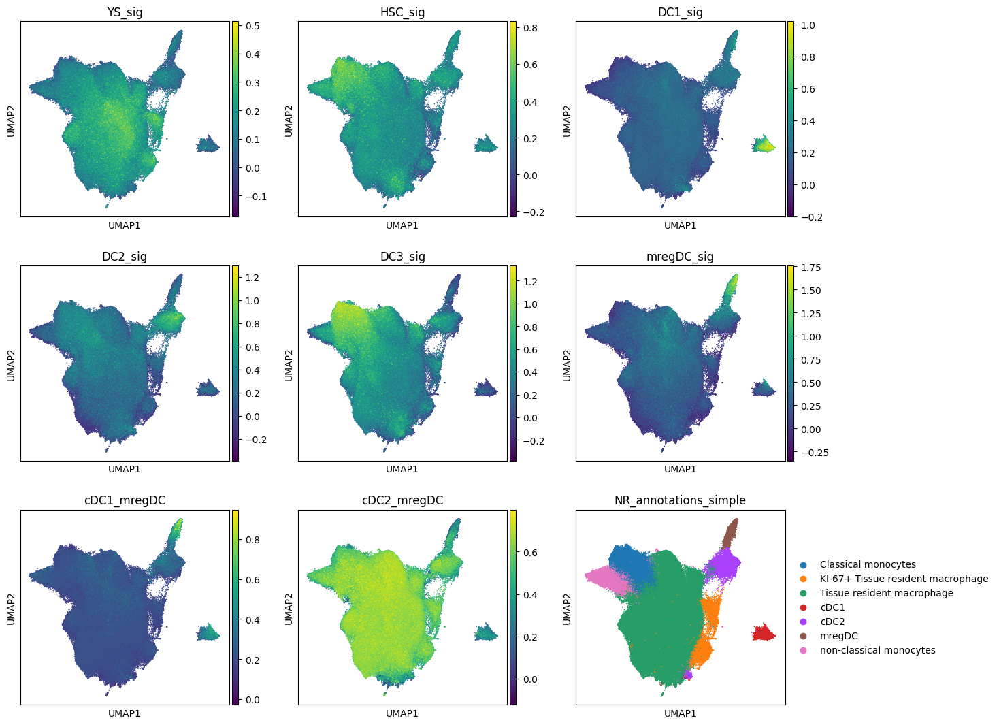

In [47]:
#plotting 
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color=colour_vars, ncols=3, size=5)

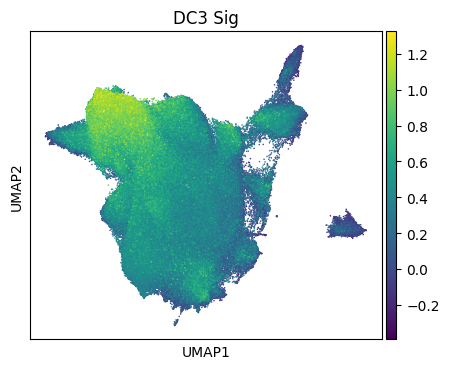

In [33]:
#plotting 
with plt.rc_context({"figure.figsize": (5, 4)}):
    sc.pl.umap(data, color="DC3_sig", ncols=3, size=5, title="DC3 Sig")

/scratch/temp/11603491/ipykernel_2072644/3784443177.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


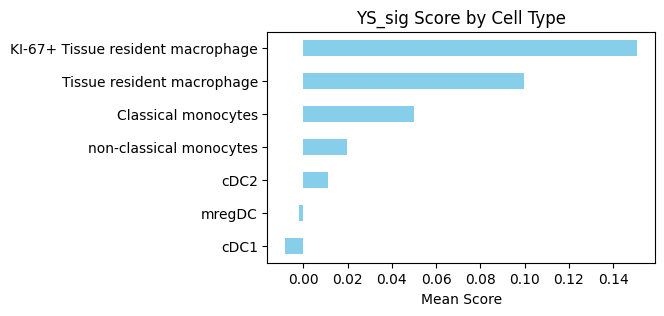

/scratch/temp/11603491/ipykernel_2072644/3784443177.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


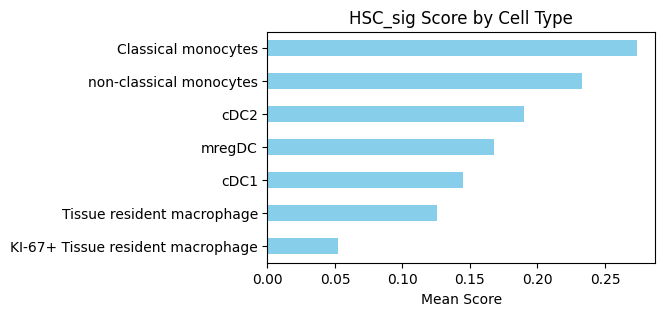

/scratch/temp/11603491/ipykernel_2072644/3784443177.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


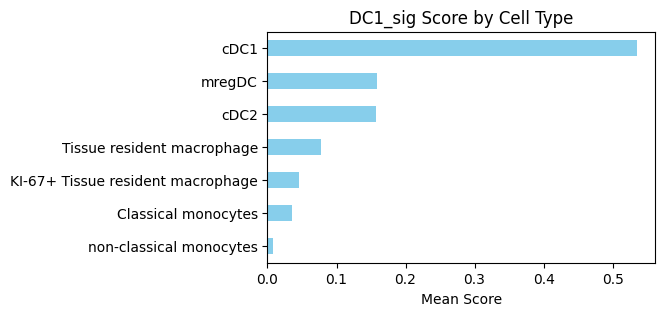

/scratch/temp/11603491/ipykernel_2072644/3784443177.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


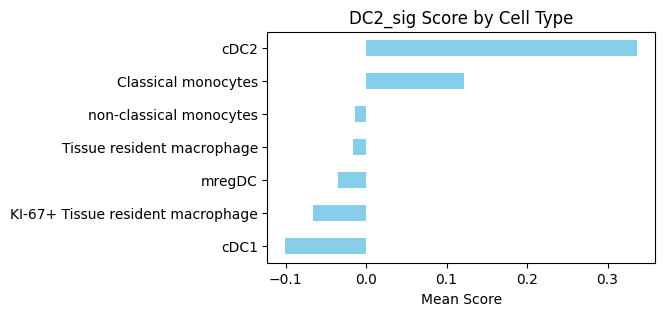

/scratch/temp/11603491/ipykernel_2072644/3784443177.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


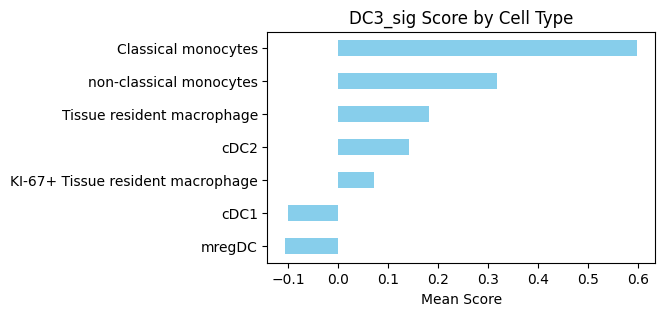

/scratch/temp/11603491/ipykernel_2072644/3784443177.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


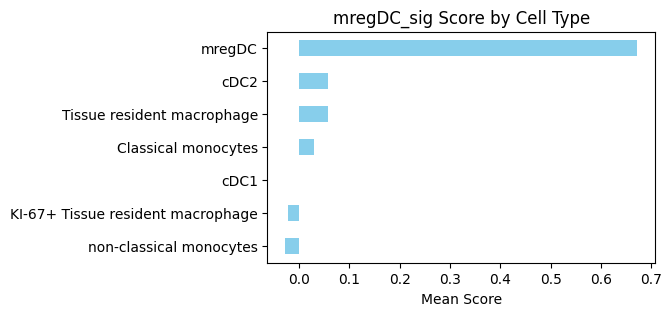

/scratch/temp/11603491/ipykernel_2072644/3784443177.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


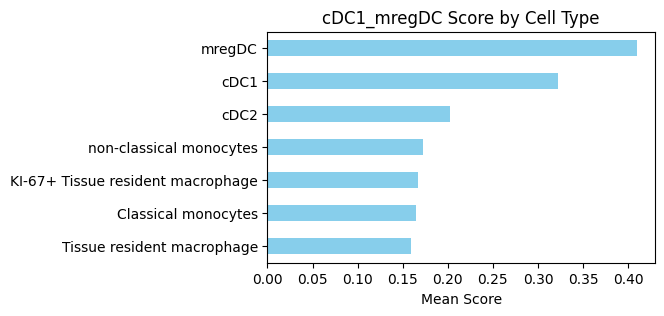

/scratch/temp/11603491/ipykernel_2072644/3784443177.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


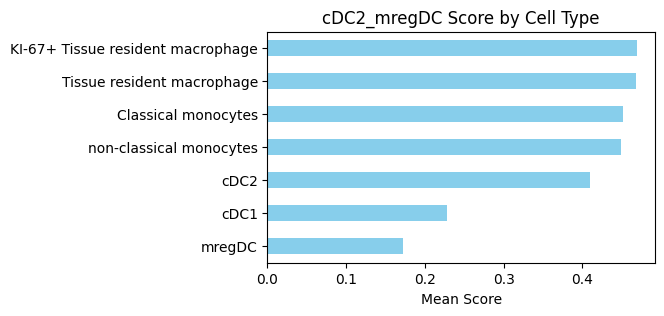

In [48]:
cluster_col = "NR_annotations_simple"

# Loop over each gene set to create a bar plot
for gene_set in gene_sets.keys():
    # Calculate the mean score for each cluster
    mean_scores = data.obs.groupby(cluster_col)[gene_set].mean()
    
    # Plot the mean scores as a horizontal bar plot
    plt.figure(figsize=(5, 3))
    mean_scores.sort_values().plot(kind='barh', color="skyblue")
    plt.xlabel("Mean Score")
    plt.title(f"{gene_set} Score by Cell Type")
    plt.ylabel("")
    plt.show()

/scratch/temp/12154261/ipykernel_2580060/1039326407.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


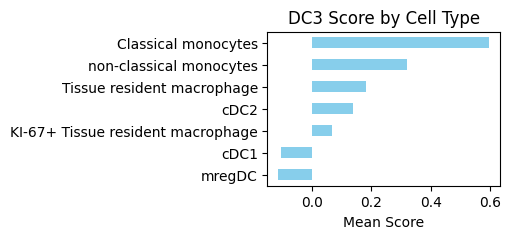

In [44]:
cluster_col = "NR_annotations_simple"

# Calculate the mean score for each cluster
mean_scores = data.obs.groupby(cluster_col)["DC3_sig"].mean()

# Plot the mean scores as a horizontal bar plot
plt.figure(figsize=(3, 2))
mean_scores.sort_values().plot(kind='barh', color="skyblue")
plt.xlabel("Mean Score")
plt.title("DC3 Score by Cell Type")
plt.ylabel("")
plt.show()

In [49]:
# Initialize an empty DataFrame to store mean scores for each gene set and cluster
heatmap_data = pd.DataFrame()

In [50]:
# Loop over each gene set to calculate the mean scores by cluster
for gene_set in gene_sets.keys():
    mean_scores = data.obs.groupby(cluster_col)[gene_set].mean()
    heatmap_data[gene_set] = mean_scores

# Transpose the DataFrame to have gene sets as rows and clusters as columns
heatmap_data = heatmap_data.T

/scratch/temp/11603491/ipykernel_2072644/4060165316.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/scratch/temp/11603491/ipykernel_2072644/4060165316.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/scratch/temp/11603491/ipykernel_2072644/4060165316.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/scratch/temp/11603491/ipykernel_2072644/4060165316.py:3: FutureWarning: The default of observed=False is deprecated a

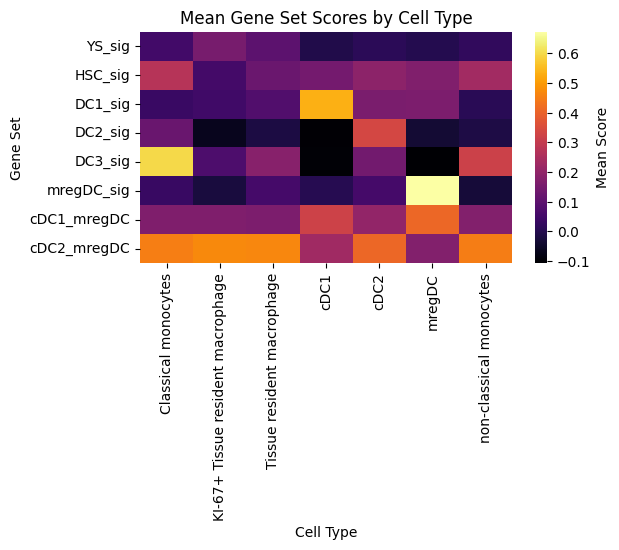

In [51]:
# Plot heatmap
plt.figure(figsize=(6, 3))
sns.heatmap(heatmap_data, cmap="inferno", annot=False, cbar_kws={'label': 'Mean Score'})
plt.xlabel("Cell Type")
plt.ylabel("Gene Set")
plt.title("Mean Gene Set Scores by Cell Type")
plt.show()

# show canonical markers
* heatmap? UMAP overlay? dot plot?

In [52]:
myeloid_genes = {
    "APC": ["HLA-DRA"],
    "cDC1": ["CLEC9A", "XCR1","BATF3","IRF8"],
    "cDC2": ["CD1C", "FCER1A", "CLEC10A","IRF4"],
    "mregDC": ["LAMP3","CD274","CCR7"],
    "Monocytes": ["CD14", "FCGR3A","LYZ","S100A8","S100A9","CCR2"],
    "Macrophages": ["FCGR1A","CD68","CSF1R","TREM2","SPP1"],
    "Tissue Res Macs": ["C1QA","C1QB","C1QC"],
    "Proliferating Cells": ["MKI67"]
}

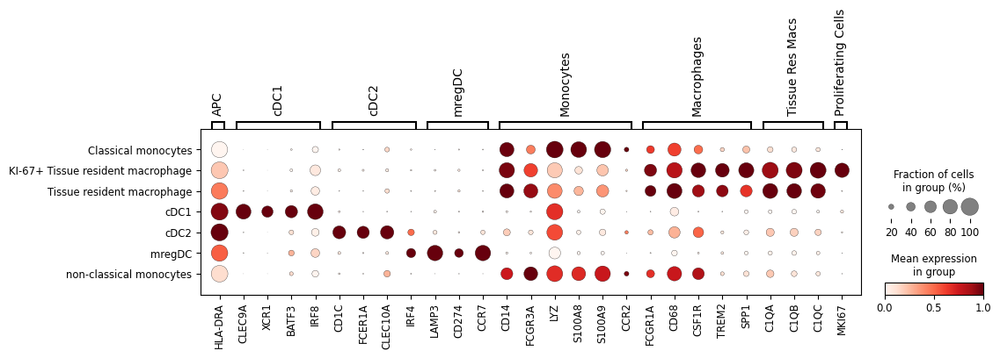

In [53]:
sc.pl.dotplot(data, myeloid_genes, groupby="NR_annotations_simple", standard_scale="var")

In [20]:
fig_genes = {
    "cDC1": ["CLEC9A", "XCR1","BATF3","IRF8"],
    "cDC2": ["CD1C", "FCER1A", "CLEC10A"],
    "mregDC": ["LAMP3","CD274","CCR7"],
    "Mono": ["LYZ","S100A8","S100A9","CD14","FCGR3A"],
    "Mac": ["FCGR1A","CD68","CSF1R","TREM2","SPP1"],
    "Tissue Res.": ["C1QA","C1QB","C1QC"],
    "Prolif.": ["MKI67"]
}

In [26]:
cat_order = ["cDC1","cDC2","mregDC","Classical monocytes","non-classical monocytes","Tissue resident macrophage","KI-67+ Tissue resident macrophage"]

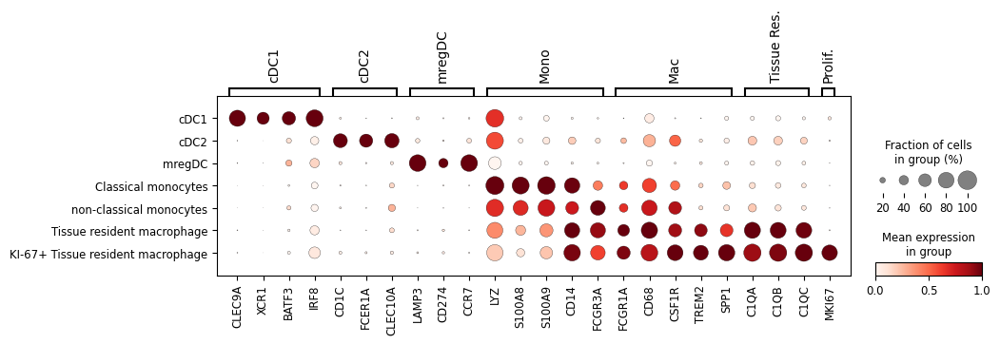

In [27]:
sc.pl.dotplot(data, fig_genes, groupby="NR_annotations_simple", standard_scale="var", categories_order=cat_order)

In [54]:
broad_markers = ["CLEC9A", "XCR1","BATF3","IRF8","CD1C", "FCER1A", "CLEC10A","IRF4","LAMP3","CD274","CCR7", "CD14", "FCGR3A", "LYZ","S100A8","S100A9",
                 "CCR2", "FCGR1A", "CD68","CSF1R","TREM2","SPP1","C1QA","C1QB","C1QC","MKI67"]

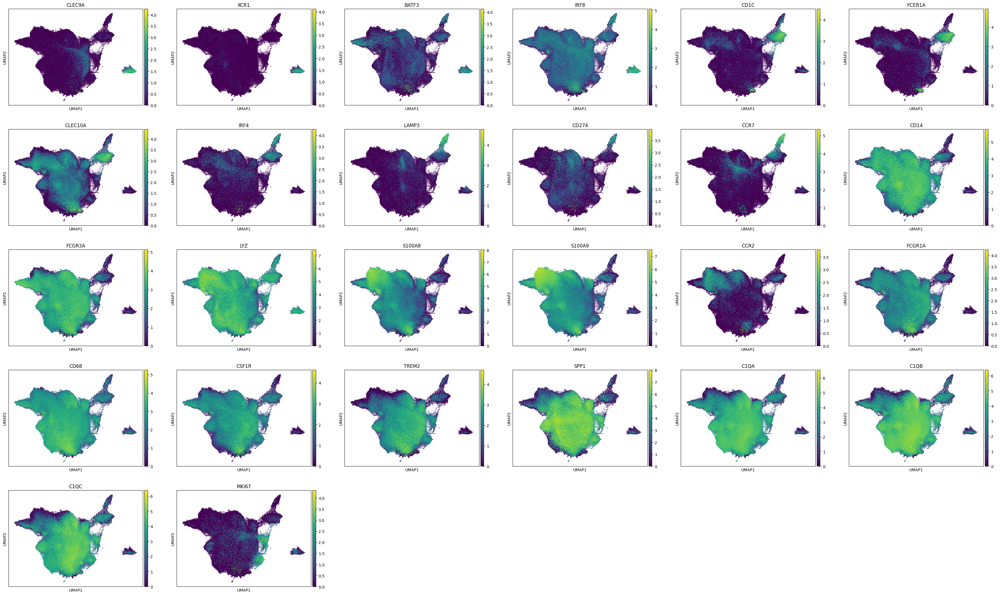

In [56]:
#plot DC/mono/mac marker genes on UMAP 
sc.pl.umap(
    data,
    color=broad_markers,
    ncols=6,
    size=5,
)

# atlas summary plots: number of samples/cells by cancer type, tissue type, site etc

In [58]:
# check 
H_counts = data.obs['cancer_type_broad'].value_counts()
print(H_counts)

cancer_type_broad
HGSOC             212070
NA                 63409
NSCLC              54888
HNSCC              52659
GBM                34224
Breast Cancer      31823
PDAC               14061
HCC                12019
Melanoma           10542
CRC                 3879
iCCA                3466
GAC                 2894
NPC                 1610
Acral Melanoma       479
Name: count, dtype: int64


In [4]:
H_counts = data.obs['cancer_with_H'].value_counts()
print(H_counts)

cancer_with_H
HGSOC             213319
NSCLC             110844
HNSCC              52659
GBM                34224
Breast Cancer      32630
HCC                15298
PDAC               14061
Melanoma           11624
CRC                 4805
iCCA                3576
GAC                 2894
NPC                 1610
Acral Melanoma       479
NA                     0
Name: count, dtype: int64


In [5]:
data_count = data[~data.obs["cancer_with_H"].isin(["NA"])]

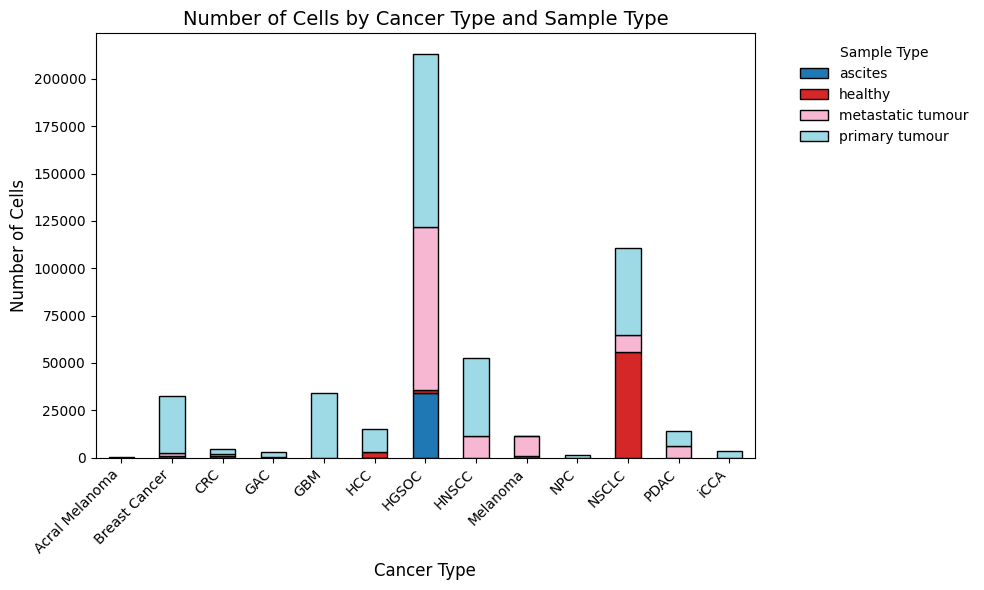

In [12]:
# Create a cross-tabulation of counts by cancer type and sample type
cell_counts = pd.crosstab(data_count.obs["cancer_with_H"], data_count.obs["sample_type_major2"])

# Plot a stacked bar chart
ax = cell_counts.plot.bar(stacked=True, figsize=(10, 6), colormap="tab20", edgecolor="black")
ax.set_title("Number of Cells by Cancer Type and Sample Type", fontsize=14)
ax.set_xlabel("Cancer Type", fontsize=12)
ax.set_ylabel("Number of Cells", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.legend(title="Sample Type", bbox_to_anchor=(1.05, 1), loc="upper left", frameon=False)
plt.tight_layout()
plt.show()

In [13]:
cell_counts.head()

sample_type_major2,ascites,healthy,metastatic tumour,primary tumour
cancer_with_H,,,,
Acral Melanoma,0,0,0,479
Breast Cancer,0,807,1903,29920
CRC,0,926,1101,2778
GAC,0,0,477,2417
GBM,0,0,0,34224


In [14]:
cell_counts.to_csv("Atlas_Final_Summary_Cells.csv", index=True)

/scratch/temp/12237070/ipykernel_1220297/1043732579.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


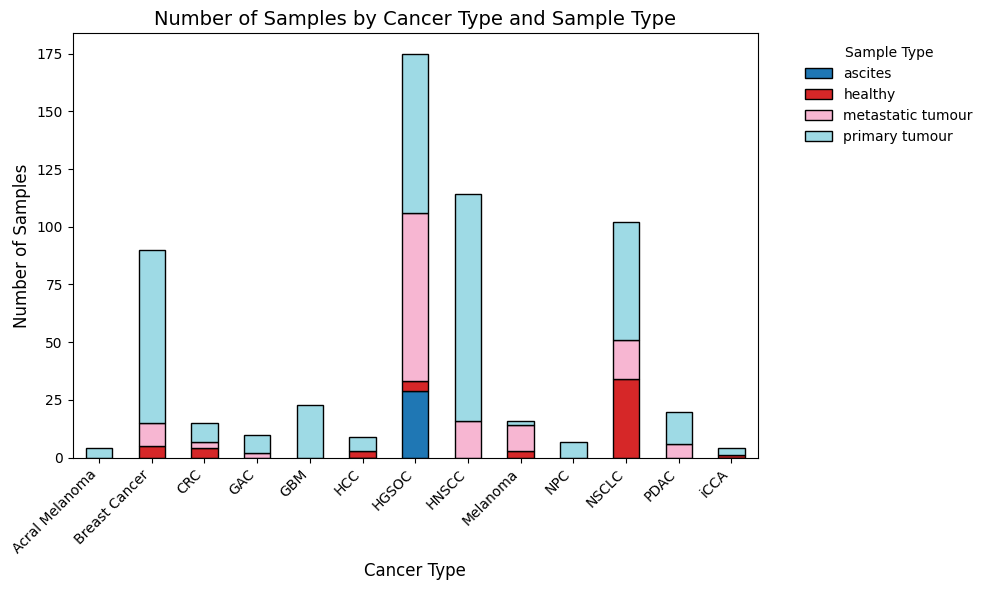

In [15]:
# Group by cancer_type_broad and sample_type, then count unique integration_ids
cell_counts = (
    data_count.obs.groupby(["cancer_with_H", "sample_type_major2"])["integration_id"]
    .nunique()
    .unstack(fill_value=0)  # Pivot to create a table format
)

# Plot a stacked bar chart
ax = cell_counts.plot.bar(stacked=True, figsize=(10, 6), colormap="tab20", edgecolor="black")
ax.set_title("Number of Samples by Cancer Type and Sample Type", fontsize=14)
ax.set_xlabel("Cancer Type", fontsize=12)
ax.set_ylabel("Number of Samples", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.legend(title="Sample Type", bbox_to_anchor=(1.05, 1), loc="upper left", frameon=False)
plt.tight_layout()
plt.show()

In [16]:
cell_counts.head()

sample_type_major2,ascites,healthy,metastatic tumour,primary tumour
cancer_with_H,,,,
Acral Melanoma,0,0,0,4
Breast Cancer,0,5,10,75
CRC,0,4,3,8
GAC,0,0,2,8
GBM,0,0,0,23


In [17]:
cell_counts.to_csv("Atlas_Final_Summary_Samples.csv", index=True)

In [28]:
data.obs.head()

,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,site,sample_type_major,cancer_subtype,...,DC_Axl_sig,DC2_up_DC3,DC3_up_DC2,mregDC_sig,cDC1_mregDC,cDC2_mregDC,NR_annotations,NR_annotations_simple,sample_type_major2,cancer_with_H
GSE215120_AM1_AAACCTGGTTGCTCCT-1,20298.0,3789.0,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,0.975466,skin,primary tumour,Acral Melanoma,...,0.063861,0.588479,0.082309,0.435951,0.279165,0.553687,Tissue resident macrophage,Tissue resident macrophage,primary tumour,Acral Melanoma
GSE215120_AM1_AAAGATGTCCAAATGC-1,5574.0,1721.0,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,6.045928,skin,primary tumour,Acral Melanoma,...,0.094962,0.096703,0.189334,0.275931,0.177009,0.444586,Tissue resident macrophage,Tissue resident macrophage,primary tumour,Acral Melanoma
GSE215120_AM1_AAATGCCCAGAGCCAA-1,17143.0,2659.0,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,1.224990,skin,primary tumour,Acral Melanoma,...,0.085564,0.494592,0.124530,0.427229,0.259460,0.489422,cDC2,cDC2,primary tumour,Acral Melanoma
GSE215120_AM1_ACACTGAAGATCCCGC-1,5912.0,1374.0,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,2.503383,skin,primary tumour,Acral Melanoma,...,0.056393,0.002664,0.470527,0.223862,0.230512,0.458001,Classical monocytes,Classical monocytes,primary tumour,Acral Melanoma
GSE215120_AM1_ACACTGATCCACTGGG-1,18333.0,2845.0,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,1.063656,skin,primary tumour,Acral Melanoma,...,0.083336,0.649041,0.226950,0.617883,0.281696,0.620768,cDC2,cDC2,primary tumour,Acral Melanoma


In [30]:
data.X.min(), data.X.max()

(-10.0, 10.0)

In [31]:
data.shape

(498023, 1268)

In [32]:
hasattr(data, "raw")

True

### Stats:

In [9]:
# total number of cells:
data.shape

(498023, 1268)

In [10]:
# total number of samples: 
data.obs["integration_id"].nunique()

589

# output number of samples per dataset per sample type

In [4]:
data

AnnData object with n_obs × n_vars = 498023 × 1268
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'cancer_type_broad', 'clean-leiden_0.8', 'clean-subcluster', 'clean-subcluster-v2', 'YS_sig', 'HSC_sig', 'CD5nDC2_up_vDC3', 'DC3_up_vCD5nDC2', 'CD5pDC2_up_vDC3', 'DC3_up_vCD5pDC2', 'DC3_up_vMono', 'Mono_up_vDC3', 'DC1_sig', 'DC2_sig', 'DC3_sig', 'DC_Axl_sig', 'DC2_up_DC3', 'DC3_up_DC2', 'mregDC_sig', 'cDC1_mregDC', 'cDC2_mregDC', 'NR_annotati

In [5]:
counts = data.obs['sample_type_major2'].value_counts()
print(counts)

sample_type_major2
primary tumour       273023
metastatic tumour    127339
healthy               63409
ascites               34252
Name: count, dtype: int64


In [7]:
# Group by dataset_id and sample_type, then count unique integration_ids
sample_counts = (
    data.obs.groupby(["dataset_id", "sample_type_major2"])["integration_id"]
    .nunique()
    .unstack(fill_value=0)  # Pivot to create a table format
)

/scratch/temp/12362819/ipykernel_2981227/3329902774.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


In [9]:
sample_counts

sample_type_major2,ascites,healthy,metastatic tumour,primary tumour
dataset_id,,,,
GSE112271,0,0,0,2
GSE131907,0,11,17,15
GSE139324,0,0,0,22
GSE154778,0,0,0,3
GSE154826,0,21,0,25
GSE156405,0,0,3,3
GSE161529,0,4,3,27
GSE162025,0,0,0,7
GSE162498,0,2,0,11


In [10]:
# make object for each sample type
data_PMID = data[data.obs["dataset_id"] == "PMID32561858"]
data_189 = data[data.obs["dataset_id"] == "GSE189903"]


In [13]:
# Group by cancer type and sample_type, then count unique integration_ids
PMID_counts = (
    data_PMID.obs.groupby(["cancer_with_H", "sample_type_major2"])["integration_id"]
    .nunique()
    .unstack(fill_value=0)  # Pivot to create a table format
)

d189_counts = (
    data_189.obs.groupby(["cancer_with_H", "sample_type_major2"])["integration_id"]
    .nunique()
    .unstack(fill_value=0)  # Pivot to create a table format
)

/scratch/temp/12362819/ipykernel_2981227/2763046487.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/scratch/temp/12362819/ipykernel_2981227/2763046487.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


In [14]:
PMID_counts

sample_type_major2,healthy,primary tumour
cancer_with_H,,
Breast Cancer,0,12
CRC,4,7


In [15]:
d189_counts

sample_type_major2,healthy,primary tumour
cancer_with_H,,
HCC,3,4
iCCA,1,3


# save

In [45]:
#save object
#data.write_h5ad("NRclean_clustered.h5ad", compression="gzip")

# Plotting proportion of all DC as a % of myeloid cells

In [5]:
data

AnnData object with n_obs × n_vars = 498023 × 1268
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'cancer_type_broad', 'clean-leiden_0.8', 'clean-subcluster', 'clean-subcluster-v2', 'YS_sig', 'HSC_sig', 'CD5nDC2_up_vDC3', 'DC3_up_vCD5nDC2', 'CD5pDC2_up_vDC3', 'DC3_up_vCD5pDC2', 'DC3_up_vMono', 'Mono_up_vDC3', 'DC1_sig', 'DC2_sig', 'DC3_sig', 'DC_Axl_sig', 'DC2_up_DC3', 'DC3_up_DC2', 'mregDC_sig', 'cDC1_mregDC', 'cDC2_mregDC', 'NR_annotati

## make new column with DC grouped

In [6]:
# check 
type_counts = data.obs['NR_annotations_simple'].value_counts()
print(type_counts)

NR_annotations_simple
Tissue resident macrophage           368421
Classical monocytes                   57086
non-classical monocytes               29255
cDC2                                  17391
KI-67+ Tissue resident macrophage     13020
cDC1                                   6730
mregDC                                 6120
Name: count, dtype: int64


In [7]:
#make simple annotations
data.obs["annots_broad_DC"] = data.obs["NR_annotations_simple"].map(
    {
        "Tissue resident macrophage": "Tissue resident macrophage",
        "Classical monocytes": "Classical monocytes",
        "non-classical monocytes": "non-classical monocytes",
        "cDC2": "DC",
        "KI-67+ Tissue resident macrophage": "KI-67+ Tissue resident macrophage",
        "cDC1": "DC",
        "mregDC": "DC"
    }
)

In [8]:
# check 
type_counts = data.obs['annots_broad_DC'].value_counts()
print(type_counts)

annots_broad_DC
Tissue resident macrophage           368421
Classical monocytes                   57086
DC                                    30241
non-classical monocytes               29255
KI-67+ Tissue resident macrophage     13020
Name: count, dtype: int64


In [9]:
#make an object for just primary and metastatic tumours
data_primary = data[data.obs["sample_type_major2"] == "primary tumour"]
data_mets = data[data.obs["sample_type_major2"] == "metastatic tumour"]
data_H = data[data.obs["sample_type_major2"] == "healthy"]
data_OC = data[data.obs["cancer_with_H"] == "HGSOC"]

## Primary tumour:

### Calculate the proportion of DCs per sample and cancer subtype: 

In [10]:
# Create a DataFrame containing just sample, subtype and annotations 
df = data_primary.obs[["integration_id", "cancer_broadest", "annots_broad_DC"]].copy()

# Create a new column for each DC type, indicating whether each cell belongs to that type (True vs False)
df["is_DC"] = df["annots_broad_DC"] == "DC"

# Calculate proportions of each DC type per sample within each cancer subtype
proportion_df = (
    df.groupby(["integration_id", "cancer_broadest"])[["is_DC"]] #groups dataframe by each unique combo of sample_id and cancer type, keeps the booleen columns 
    .mean() #calculating the mean of a booleen column gives the proportion of true values 
    .reset_index()
    .rename(columns={"is_DC": "DC_proportion"}) #rename eg. is_cDC1 column to cDC1_proportion
)

#now have a dataframe containing proportion of each DC type for every sample and cancer type
proportion_df.head(15)

/scratch/temp/12495067/ipykernel_3679255/3005596507.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,integration_id,cancer_broadest,DC_proportion
0,GGSE223063_GLIO_1,BC,NaN
1,GGSE223063_GLIO_1,CRC,NaN
2,GGSE223063_GLIO_1,GAC,NaN
3,GGSE223063_GLIO_1,GBM,0.020145
4,GGSE223063_GLIO_1,HCC,NaN
5,GGSE223063_GLIO_1,HGSOC,NaN
6,GGSE223063_GLIO_1,HNSCC,NaN
7,GGSE223063_GLIO_1,MEL,NaN
8,GGSE223063_GLIO_1,NPC,NaN
9,GGSE223063_GLIO_1,NSCLC,NaN


In [11]:
# Melt the DataFrame to "long" format for seaborn plotting
proportion_df_long = proportion_df.melt(
    id_vars=["integration_id", "cancer_broadest"], 
    value_vars=["DC_proportion"],
    var_name="Cell_Type",
    value_name="Proportion"
)

proportion_df_long.head(15)

,integration_id,cancer_broadest,Cell_Type,Proportion
0,GGSE223063_GLIO_1,BC,DC_proportion,NaN
1,GGSE223063_GLIO_1,CRC,DC_proportion,NaN
2,GGSE223063_GLIO_1,GAC,DC_proportion,NaN
3,GGSE223063_GLIO_1,GBM,DC_proportion,0.020145
4,GGSE223063_GLIO_1,HCC,DC_proportion,NaN
5,GGSE223063_GLIO_1,HGSOC,DC_proportion,NaN
6,GGSE223063_GLIO_1,HNSCC,DC_proportion,NaN
7,GGSE223063_GLIO_1,MEL,DC_proportion,NaN
8,GGSE223063_GLIO_1,NPC,DC_proportion,NaN
9,GGSE223063_GLIO_1,NSCLC,DC_proportion,NaN


In [12]:
#export proportion_df_long 
proportion_df_long.to_excel("2025-02-09_DC_prop_pooled_primary.xlsx", index=False)

# Mets: 

In [13]:
# Create a DataFrame containing just sample, subtype and annotations 
df = data_mets.obs[["integration_id", "cancer_broadest", "annots_broad_DC"]].copy()

# Create a new column for each DC type, indicating whether each cell belongs to that type (True vs False)
df["is_DC"] = df["annots_broad_DC"] == "DC"

# Calculate proportions of each DC type per sample within each cancer subtype
proportion_df = (
    df.groupby(["integration_id", "cancer_broadest"])[["is_DC"]] #groups dataframe by each unique combo of sample_id and cancer type, keeps the booleen columns 
    .mean() #calculating the mean of a booleen column gives the proportion of true values 
    .reset_index()
    .rename(columns={"is_DC": "DC_proportion"}) #rename eg. is_cDC1 column to cDC1_proportion
)

# Melt the DataFrame to "long" format for seaborn plotting
proportion_df_long = proportion_df.melt(
    id_vars=["integration_id", "cancer_broadest"], 
    value_vars=["DC_proportion"],
    var_name="Cell_Type",
    value_name="Proportion"
)

#export proportion_df_long 
proportion_df_long.to_excel("2025-02-09_DC_prop_pooled_mets.xlsx", index=False)

/scratch/temp/12495067/ipykernel_3679255/1032758346.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


# Healthy: 

In [15]:
# Create a DataFrame containing just sample, subtype and annotations 
df = data_H.obs[["integration_id", "site", "annots_broad_DC"]].copy()

# Create a new column for each DC type, indicating whether each cell belongs to that type (True vs False)
df["is_DC"] = df["annots_broad_DC"] == "DC"

# Calculate proportions of each DC type per sample within each cancer subtype
proportion_df = (
    df.groupby(["integration_id", "site"])[["is_DC"]] #groups dataframe by each unique combo of sample_id and cancer type, keeps the booleen columns 
    .mean() #calculating the mean of a booleen column gives the proportion of true values 
    .reset_index()
    .rename(columns={"is_DC": "DC_proportion"}) #rename eg. is_cDC1 column to cDC1_proportion
)

# Melt the DataFrame to "long" format for seaborn plotting
proportion_df_long = proportion_df.melt(
    id_vars=["integration_id", "site"], 
    value_vars=["DC_proportion"],
    var_name="Cell_Type",
    value_name="Proportion"
)

#export proportion_df_long 
proportion_df_long.to_excel("2025-02-09_DC_prop_pooled_healthy.xlsx", index=False)

/scratch/temp/12495067/ipykernel_3679255/1901648303.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
